<div style="display: flex; justify-content: flex-start">

<h1  style="margin: auto; 
             color:#8A8A8A;
            text-align: center; 
            font-family:Helvetica, Arial, verdana, sans-serif"
    > Rosalba Juarez Mosqueda </h1> </div> 

<h1  style= "background-color: #3498DB  ;
                 color:white;
            text-align: center; 
            font-family:Helvetica, Arial, verdana, sans-serif"> 
    <br> Analysez des données de systèmes éducatifs
        <br> (Exploration et nettoyage des données)
    <br>
  
 </h1>

<nav><ul style="display: flex;
    justify-content: space-between;
    background-color: #3498DB;
    font-family:Helvetica, Arial, verdana, sans-serif;
    font-size:11pt">
    
<li style="margin: auto;color: RGB(255,255,255);"> <a style="color: RGB(255,255,255)"; href="#C1"><strong>Introduction</strong> </a> </li>
<li style="margin: auto;color: RGB(255,255,255);"> <a style="color: RGB(255,255,255)"; href="#C2"><strong>Libraries</strong></a> </li>
<li style="margin: auto;color: RGB(255,255,255);"> <a style="color: RGB(255,255,255)"; href="#C3"><strong>Exploration</strong></a> </li>
<li style="margin: auto;color: RGB(255,255,255);"> <a style="color: RGB(255,255,255)"; href="#C4"><strong> Preparation et Nettoyage </strong></a> </li>
<li style="margin: auto;color: RGB(255,255,255);"> <a style="color: RGB(255,255,255)"; href="#C5"> <strong>Analyse</strong> </a> </li>
<li style="margin: auto;color: RGB(255,255,255);"> <a style="color: RGB(255,255,255)"; href="#C6"><strong>Conclusion</strong></a></li>
</ul></nav>

<h2  style="margin: auto; 
            text-align: center; 
            font-family:Helvetica, Arial, verdana, sans-serif"><a name="C1"> 1. Introduction </a> </h2>
<br>

Academy est une start-up de la EdTech qui propose des contenus de formation en ligne pour un public de niveau lycée et université. L'entreprise a la vision de l'expansion et pour cela, il est nécessaire d'identifier :

 
1. Quels sont les pays avec un fort potentiel de clients pour ses services ?
2. Pour chacun de ces pays, quelle sera l’évolution de ce potentiel de clients ?
3. Dans quels pays l'entreprise doit-elle opérer en priorité ?

La mission consiste à effectuer une analyse exploratoire pour déterminer si les données sur l’éducation de la banque mondiale permettent d’informer le projet d’expansion 


Les données de la Banque mondiale sont disponibles à l’adresse suivante :

https://datacatalog.worldbank.org/dataset/education-statistics

https://datatopics.worldbank.org/education/indicators

<h2> Tâche  </h2>

    * Valider la qualité de ce jeu de données (comporte-t-il beaucoup de données manquantes, dupliquées ?)
    * Sélectionner les informations qui semblent pertinentes pour répondre à la problématique 
    * Déterminer des ordres de grandeurs des indicateurs statistiques classiques pour les différentes zones      géographiques et pays du monde (moyenne/médiane/écart-type par pays et par continent ou bloc géographique)



<h2  style="margin: auto; 
            text-align: center; 
            font-family:Helvetica, Arial, verdana, sans-serif"><a name="C2"> 2. Libraries </a> </h2>
<br>

In [1]:
import pandas as pd
import numpy as np
import missingno as msno
import warnings
warnings.filterwarnings("ignore")
import geopandas



## plot
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot



# Sklearn
from sklearn.impute import KNNImputer



In [2]:
#vérification versions bibliothèques
print("Version Pandas :",pd.__version__)
print("Version Numpy :",np.__version__)
print("Version Seaborn :",sns.__version__)
print("Version Missingno :", msno.__version__)

Version Pandas : 1.5.0
Version Numpy : 1.23.1
Version Seaborn : 0.12.0
Version Missingno : 0.4.2


<h2  style="margin: auto; 
            text-align: center; 
            font-family:Helvetica, Arial, verdana, sans-serif"><a name="C3"> 3. Exploration de donées </a> </h2>
<br>

## 3. Analyse des fichiers

In [3]:
#appel repertoires
path = "/home/rosalba/Openclassrooms_Projects/Project_2_Exploratory_Analysis/Projet_2_RawData/"

### 3.1. Fichier EdStatsCountry-Series

In [4]:
Country_Series = pd.read_csv(path + "EdStatsCountry-Series.csv") 
Country_Series

,CountryCode,SeriesCode,DESCRIPTION,Unnamed: 3
0,ABW,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
1,ABW,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
2,AFG,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
3,AFG,NY.GDP.PCAP.PP.CD,Estimates are based on regression.,NaN
4,AFG,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
...,...,...,...,...
608,ZAF,SP.POP.GROW,"Data sources : Statistics South Africa, United...",NaN
609,ZMB,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
610,ZMB,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
611,ZWE,SP.POP.TOTL,Data sources : United Nations World Population...,NaN


In [5]:
Country_Series.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 613 entries, 0 to 612
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   CountryCode  613 non-null    object 
 1   SeriesCode   613 non-null    object 
 2   DESCRIPTION  613 non-null    object 
 3   Unnamed: 3   0 non-null      float64
dtypes: float64(1), object(3)
memory usage: 19.3+ KB


<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
    <p> <b>Ce fichier décrit la provenance de l'indicateur. </b></p>

### 3.2. Fichier EdStatsCountry

In [6]:
Country = pd.read_csv(path + "EdStatsCountry.csv") 
Country.head(3)

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,...,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data,Unnamed: 31
0,ABW,Aruba,Aruba,Aruba,AW,Aruban florin,SNA data for 2000-2011 are updated from offici...,Latin America & Caribbean,High income: nonOECD,AW,...,NaN,2010,NaN,NaN,Yes,NaN,NaN,2012.0,NaN,NaN
1,AFG,Afghanistan,Afghanistan,Islamic State of Afghanistan,AF,Afghan afghani,Fiscal year end: March 20; reporting period fo...,South Asia,Low income,AF,...,General Data Dissemination System (GDDS),1979,"Multiple Indicator Cluster Survey (MICS), 2010/11","Integrated household survey (IHS), 2008",NaN,2013/14,NaN,2012.0,2000,NaN
2,AGO,Angola,Angola,People's Republic of Angola,AO,Angolan kwanza,"April 2013 database update: Based on IMF data,...",Sub-Saharan Africa,Upper middle income,AO,...,General Data Dissemination System (GDDS),1970,"Malaria Indicator Survey (MIS), 2011","Integrated household survey (IHS), 2008",NaN,2015,NaN,NaN,2005,NaN


In [7]:
display(Country.info(), Country.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241 entries, 0 to 240
Data columns (total 32 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Country Code                                       241 non-null    object 
 1   Short Name                                         241 non-null    object 
 2   Table Name                                         241 non-null    object 
 3   Long Name                                          241 non-null    object 
 4   2-alpha code                                       238 non-null    object 
 5   Currency Unit                                      215 non-null    object 
 6   Special Notes                                      145 non-null    object 
 7   Region                                             214 non-null    object 
 8   Income Group                                       214 non-null    object 
 9   WB-2 code 

None

(241, 32)

<AxesSubplot: >

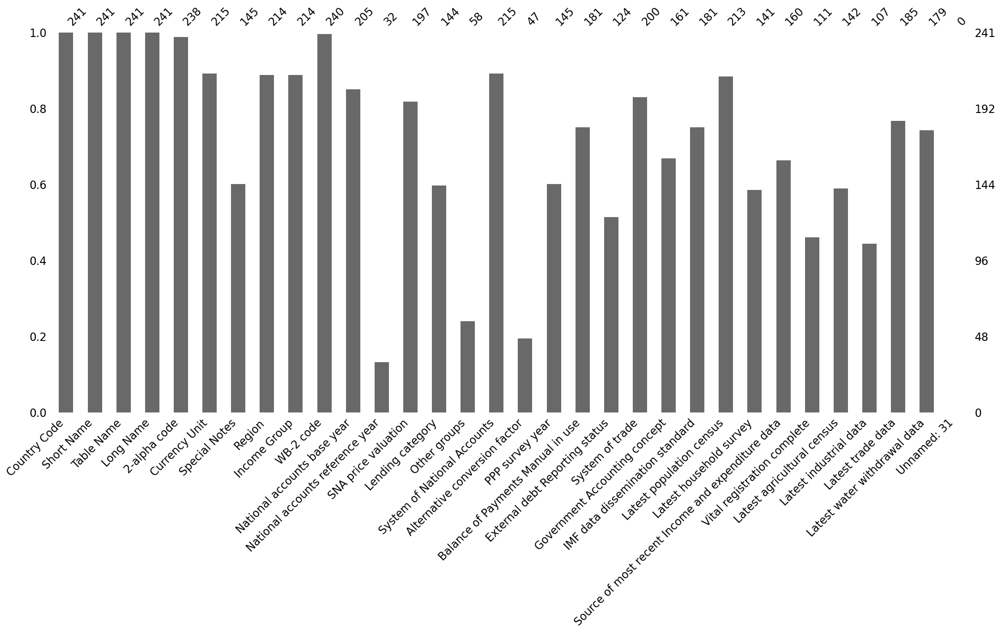

In [8]:
#visualisation valeurs manquantes: 
msno.bar(Country)

<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
    <p> <b>Ce fichier donne des informations plus detailles sur les pays (par example, leur region géographique). </b></p>

In [9]:
241-214

27

<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
    <p> <b> Dans la colonne "Région", il y a 27 valeurs manquantes, ce qui signifie qu'il y a 27 "pays" supposés sans région. Pour les identifier, on fait la suite: </b></p>

In [10]:
Country[Country['Region'].isnull()]

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,...,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data,Unnamed: 31
5,ARB,Arab World,Arab World,Arab World,1A,NaN,Arab World aggregate. Arab World is composed o...,NaN,NaN,1A,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
57,EAP,East Asia & Pacific (developing only),East Asia & Pacific,East Asia & Pacific (developing only),4E,NaN,East Asia and Pacific regional aggregate (does...,NaN,NaN,4E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
58,EAS,East Asia & Pacific (all income levels),East Asia & Pacific (all income levels),East Asia & Pacific (all income levels),Z4,NaN,East Asia and Pacific regional aggregate (incl...,NaN,NaN,Z4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59,ECA,Europe & Central Asia (developing only),Europe & Central Asia,Europe & Central Asia (developing only),7E,NaN,Europe and Central Asia regional aggregate (do...,NaN,NaN,7E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60,ECS,Europe & Central Asia (all income levels),Europe & Central Asia (all income levels),Europe & Central Asia (all income levels),Z7,NaN,Europe and Central Asia regional aggregate (in...,NaN,NaN,Z7,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
63,EMU,Euro area,Euro area,Euro area,XC,NaN,Euro area aggregate.,NaN,NaN,XC,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
68,EUU,European Union,European Union,European Union,EU,NaN,European Union aggregate.,NaN,NaN,EU,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78,GIB,Gibraltar,Gibraltar,Gibraltar,GI,Gibraltar pound,NaN,NaN,NaN,GI,...,NaN,2012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
89,HIC,High income,High income,High income,XD,NaN,High income group aggregate. High-income econo...,NaN,NaN,XD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92,HPC,Heavily indebted poor countries (HIPC),Heavily indebted poor countries (HIPC),Heavily indebted poor countries (HIPC),XE,NaN,Heavily indebted poor countries aggregate.,NaN,NaN,XE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
faux_pays = Country[Country['Region'].isnull()]["Short Name"]
faux_pays

5                                          Arab World
57              East Asia & Pacific (developing only)
58            East Asia & Pacific (all income levels)
59            Europe & Central Asia (developing only)
60          Europe & Central Asia (all income levels)
63                                          Euro area
68                                     European Union
78                                          Gibraltar
89                                        High income
92             Heavily indebted poor countries (HIPC)
116       Latin America & Caribbean (developing only)
122     Latin America & Caribbean (all income levels)
123      Least developed countries: UN classification
124                                        Low income
127                               Lower middle income
128                               Low & middle income
140    Middle East & North Africa (all income levels)
143                                     Middle income
148      Middle East & North

In [12]:
faux_pays = Country[Country['Region'].isnull()]["Short Name"].unique().tolist()
print("il ya",len(faux_pays), "groupements de pays ( c.-à-d. qui ne sont pas vraiment un pays en soi, mais des dénominations données par la banque mondiale à un ensemble de pays regroupés)")
display(Country[Country['Region'].isnull()]["Short Name"].unique().tolist())


il ya 27 groupements de pays ( c.-à-d. qui ne sont pas vraiment un pays en soi, mais des dénominations données par la banque mondiale à un ensemble de pays regroupés)


['Arab World',
 'East Asia & Pacific (developing only)',
 'East Asia & Pacific (all income levels)',
 'Europe & Central Asia (developing only)',
 'Europe & Central Asia (all income levels)',
 'Euro area',
 'European Union',
 'Gibraltar',
 'High income',
 'Heavily indebted poor countries (HIPC)',
 'Latin America & Caribbean (developing only)',
 'Latin America & Caribbean (all income levels)',
 'Least developed countries: UN classification',
 'Low income',
 'Lower middle income',
 'Low & middle income',
 'Middle East & North Africa (all income levels)',
 'Middle income',
 'Middle East & North Africa (developing only)',
 'North America',
 'Nauru',
 'OECD members',
 'South Asia',
 'Sub-Saharan Africa (developing only)',
 'Sub-Saharan Africa (all income levels)',
 'Upper middle income',
 'World']

In [13]:
Country['Region'].value_counts()

Europe & Central Asia         57
Sub-Saharan Africa            48
Latin America & Caribbean     41
East Asia & Pacific           36
Middle East & North Africa    21
South Asia                     8
North America                  3
Name: Region, dtype: int64

<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
    <p> <b> De plus, si on regroupe les régions, on se rend compte qu'il n'y a que 7 régions, selon la Banque Mondiale, qui contiennent tous les 214 pays </b></p>

In [14]:
Country[Country['Region'].notnull()]["Short Name"].unique()

array(['Aruba', 'Afghanistan', 'Angola', 'Albania', 'Andorra',
       'United Arab Emirates', 'Argentina', 'Armenia', 'American Samoa',
       'Antigua and Barbuda', 'Australia', 'Austria', 'Azerbaijan',
       'Burundi', 'Belgium', 'Benin', 'Burkina Faso', 'Bangladesh',
       'Bulgaria', 'Bahrain', 'The Bahamas', 'Bosnia and Herzegovina',
       'Belarus', 'Belize', 'Bermuda', 'Bolivia', 'Brazil', 'Barbados',
       'Brunei', 'Bhutan', 'Botswana', 'Central African Republic',
       'Canada', 'Switzerland', 'Channel Islands', 'Chile', 'China',
       "Côte d'Ivoire", 'Cameroon', 'Dem. Rep. Congo', 'Congo',
       'Colombia', 'Comoros', 'Cabo Verde', 'Costa Rica', 'Cuba',
       'Curaçao', 'Cayman Islands', 'Cyprus', 'Czech Republic', 'Germany',
       'Djibouti', 'Dominica', 'Denmark', 'Dominican Republic', 'Algeria',
       'Ecuador', 'Egypt', 'Eritrea', 'Spain', 'Estonia', 'Ethiopia',
       'Finland', 'Fiji', 'France', 'Faeroe Islands', 'Micronesia',
       'Gabon', 'United Kingdom

In [15]:
vrai_pays = Country[Country['Region'].notnull()]["Short Name"].unique().tolist()
display(vrai_pays, len(vrai_pays))

['Aruba',
 'Afghanistan',
 'Angola',
 'Albania',
 'Andorra',
 'United Arab Emirates',
 'Argentina',
 'Armenia',
 'American Samoa',
 'Antigua and Barbuda',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Burundi',
 'Belgium',
 'Benin',
 'Burkina Faso',
 'Bangladesh',
 'Bulgaria',
 'Bahrain',
 'The Bahamas',
 'Bosnia and Herzegovina',
 'Belarus',
 'Belize',
 'Bermuda',
 'Bolivia',
 'Brazil',
 'Barbados',
 'Brunei',
 'Bhutan',
 'Botswana',
 'Central African Republic',
 'Canada',
 'Switzerland',
 'Channel Islands',
 'Chile',
 'China',
 "Côte d'Ivoire",
 'Cameroon',
 'Dem. Rep. Congo',
 'Congo',
 'Colombia',
 'Comoros',
 'Cabo Verde',
 'Costa Rica',
 'Cuba',
 'Curaçao',
 'Cayman Islands',
 'Cyprus',
 'Czech Republic',
 'Germany',
 'Djibouti',
 'Dominica',
 'Denmark',
 'Dominican Republic',
 'Algeria',
 'Ecuador',
 'Egypt',
 'Eritrea',
 'Spain',
 'Estonia',
 'Ethiopia',
 'Finland',
 'Fiji',
 'France',
 'Faeroe Islands',
 'Micronesia',
 'Gabon',
 'United Kingdom',
 'Georgia',
 'Ghana',
 'Guinea',


214

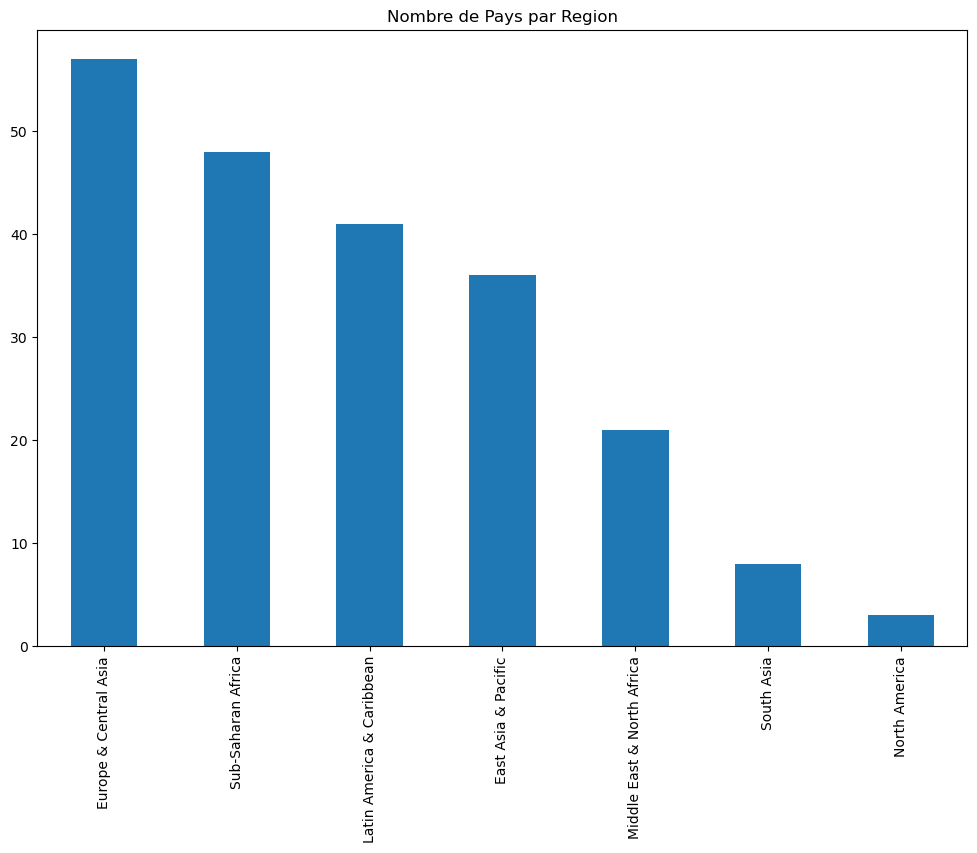

In [16]:
# Region
fig = plt.figure(figsize=(12, 8))
Country['Region'].value_counts().plot(kind='bar')
plt.title('Nombre de Pays par Region')
plt.savefig("Nombre_de_Pays_par_Region.png")

plt.show()


<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
    <p> <b> Afin de créer une base de données qui ne contienne que les informations concernant ceux qui sont des pays, nous allons éliminer toutes les informations faisant référence aux faux pays (c'est-à-dire des regroupements de pays) </b></p>

In [17]:
Country_vrai = Country[['Country Code', 'Short Name','Region', 'Income Group' ]]
Country_vrai = Country_vrai.dropna()
Country_vrai.rename(columns={'Short Name':'Country'}, inplace=True)
Country_vrai

,Country Code,Country,Region,Income Group
0,ABW,Aruba,Latin America & Caribbean,High income: nonOECD
1,AFG,Afghanistan,South Asia,Low income
2,AGO,Angola,Sub-Saharan Africa,Upper middle income
3,ALB,Albania,Europe & Central Asia,Upper middle income
4,AND,Andorra,Europe & Central Asia,High income: nonOECD
...,...,...,...,...
236,XKX,Kosovo,Europe & Central Asia,Lower middle income
237,YEM,Yemen,Middle East & North Africa,Lower middle income
238,ZAF,South Africa,Sub-Saharan Africa,Upper middle income
239,ZMB,Zambia,Sub-Saharan Africa,Lower middle income


### 3.3. Fichier EdStatsData

In [18]:
Data = pd.read_csv(path + "EdStatsData.csv") 
Data

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,54.822121,54.894138,56.209438,57.267109,57.991138,59.36554,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886925,Zimbabwe,ZWE,"Youth illiterate population, 15-24 years, male...",UIS.LP.AG15T24.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886926,Zimbabwe,ZWE,"Youth literacy rate, population 15-24 years, b...",SE.ADT.1524.LT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886927,Zimbabwe,ZWE,"Youth literacy rate, population 15-24 years, f...",SE.ADT.1524.LT.FE.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886928,Zimbabwe,ZWE,"Youth literacy rate, population 15-24 years, g...",SE.ADT.1524.LT.FM.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
Data.columns

Index(['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code',
       '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978',
       '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987',
       '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2020', '2025', '2030', '2035', '2040', '2045',
       '2050', '2055', '2060', '2065', '2070', '2075', '2080', '2085', '2090',
       '2095', '2100', 'Unnamed: 69'],
      dtype='object')

<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
    <p> <b> Ce jeu de données contient toutes les informations concernant les indicateurs, le nom et les codes des pays, ainsi que l'évolution de tous les indicateurs au fil des années  (comprises entre 1970 et 2100)</b></p>
    <p>De manière générale, ce dataframe présente les <b>valeurs des indicateurs en fonction des années</b> . </p>
        <ul>Les colonnes pertinentes pour l'analyse sont :
            <li><b>Country Code</b> </li>
            <li><b>Country Name</b> </li>
            <li><b>Indicator Code</b> </li>
            <li><b>Indicator Name</b> </li>
            <li><b>Période à analyser</b> : nous allons étudier les <b>données comprises entre 2010 et 2015</b>.</li>
        </ul> </div>
    

In [20]:
Data=Data.drop([ '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978',
       '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987',
       '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2016', '2017', '2020', '2025', '2030', '2035', '2040', '2045',
       '2050', '2055', '2060', '2065', '2070', '2075', '2080', '2085', '2090',
       '2095', '2100', 'Unnamed: 69'], axis=1)


<AxesSubplot: >

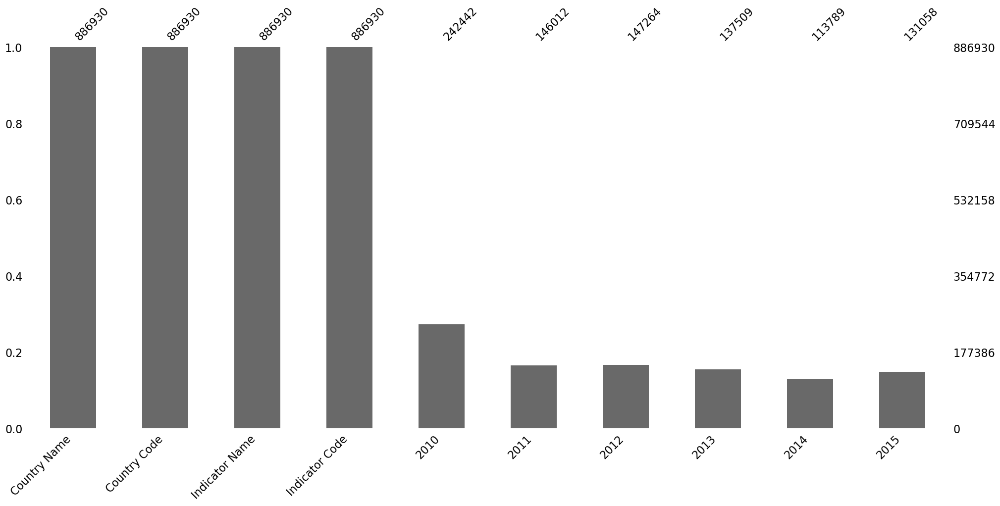

In [21]:
#visualisation valeurs manquantes: 
msno.bar(Data)

In [22]:
Data_final = Data[['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code','2010', '2011', '2012', '2013', '2014','2015']]
Data_final.rename(columns={'Country Name':'Country', 'Indicator Name':'Indicator'}, inplace=True)
display(Data_final.head(), Data_final.shape)

,Country,Country Code,Indicator,Indicator Code,2010,2011,2012,2013,2014,2015
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,85.211998,85.24514,86.101669,85.51194,85.320152,NaN


(886930, 10)

### 3.4. Fichier EdStatsSeries

In [23]:
Series = pd.read_csv(path + "EdStatsSeries.csv") 
display(Series.head(3), Series.shape)

,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,...,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
0,BAR.NOED.1519.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15-19 with...,Percentage of female population age 15-19 with...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BAR.NOED.1519.ZS,Attainment,Barro-Lee: Percentage of population age 15-19 ...,Percentage of population age 15-19 with no edu...,Percentage of population age 15-19 with no edu...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BAR.NOED.15UP.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15+ with n...,Percentage of female population age 15+ with n...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(3665, 21)

<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
    <p> <b>Ce jeu de données donne plusieurs caractéristiques de l'indicateur: catégorie, définition ,méthode de calcul, source, etc ...</b></p>
</div>       

<AxesSubplot: >

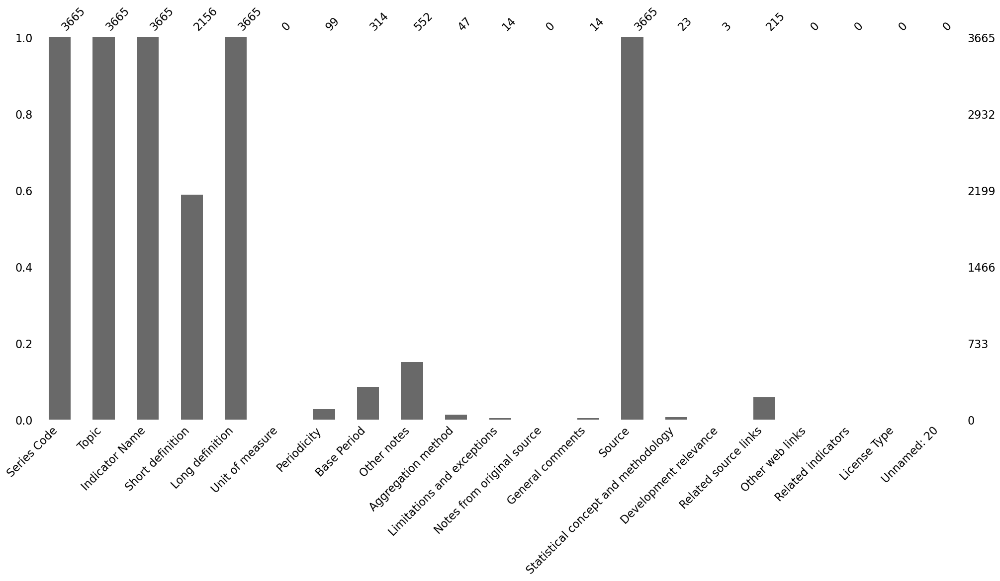

In [24]:
#visualisation valeurs manquantes: 
msno.bar(Series)

In [25]:
Series['Topic']

0         Attainment
1         Attainment
2         Attainment
3         Attainment
4         Attainment
            ...     
3660    Expenditures
3661    Expenditures
3662    Expenditures
3663    Expenditures
3664    Expenditures
Name: Topic, Length: 3665, dtype: object

In [26]:
Series['Topic'].value_counts()


Learning Outcomes                                                                               1046
Attainment                                                                                       733
Education Equality                                                                               426
Secondary                                                                                        256
Primary                                                                                          248
Population                                                                                       213
Tertiary                                                                                         158
Teachers                                                                                         137
Expenditures                                                                                      93
Engaging the Private Sector (SABER)                                                        

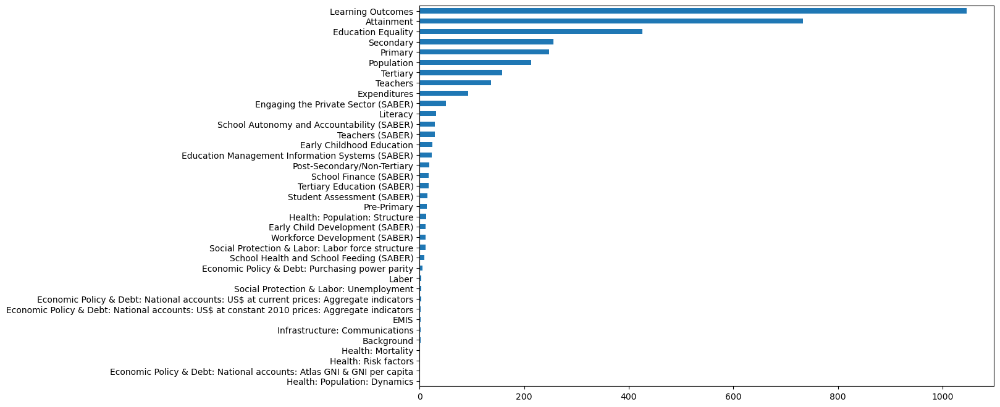

In [27]:
plt.figure(figsize=(12,8))
Series['Topic'].value_counts(sort=True, ascending=True).plot(kind='barh')
plt.savefig("Series_Topics.png")
plt.show()

In [28]:
Series['Topic'].value_counts(normalize=False, sort=True, ascending=True, bins=None, dropna=True)

Health: Population: Dynamics                                                                       1
Economic Policy & Debt: National accounts: Atlas GNI & GNI per capita                              1
Health: Risk factors                                                                               1
Health: Mortality                                                                                  1
Background                                                                                         2
Infrastructure: Communications                                                                     2
EMIS                                                                                               2
Economic Policy & Debt: National accounts: US$ at constant 2010 prices: Aggregate indicators       2
Economic Policy & Debt: National accounts: US$ at current prices: Aggregate indicators             3
Social Protection & Labor: Unemployment                                                    

### 3.5. Fichier EdStatsFootNote

In [29]:
FootNote = pd.read_csv(path + "EdStatsFootNote.csv") 
display(FootNote.head(3), FootNote.shape)


,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed: 4
0,ABW,SE.PRE.ENRL.FE,YR2001,Country estimation.,NaN
1,ABW,SE.TER.TCHR.FE,YR2005,Country estimation.,NaN
2,ABW,SE.PRE.TCHR.FE,YR2000,Country estimation.,NaN


(643638, 5)

<h2  style="margin: auto; 
            text-align: center; 
            font-family:Helvetica, Arial, verdana, sans-serif"><a name="C4"> 4. Preparation et Nettoyage des données </a> </h2>
<br>

 ## 4.1 Fusion des données d'intérêt 

In [30]:
df1 = Country_vrai.merge(Data_final, on=['Country Code'], how='inner')
df1.rename(columns={'Country_x':'Country'}, inplace=True)
display(df1.head(3), df1.shape)

,Country Code,Country,Region,Income Group,Country_y,Indicator,Indicator Code,2010,2011,2012,2013,2014,2015
0,ABW,Aruba,Latin America & Caribbean,High income: nonOECD,Aruba,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,78.047157,NaN,NaN,NaN,NaN
1,ABW,Aruba,Latin America & Caribbean,High income: nonOECD,Aruba,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,82.111633,NaN,NaN,NaN,NaN
2,ABW,Aruba,Latin America & Caribbean,High income: nonOECD,Aruba,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,1.108400,NaN,NaN,NaN,NaN


(784310, 13)

<AxesSubplot: >

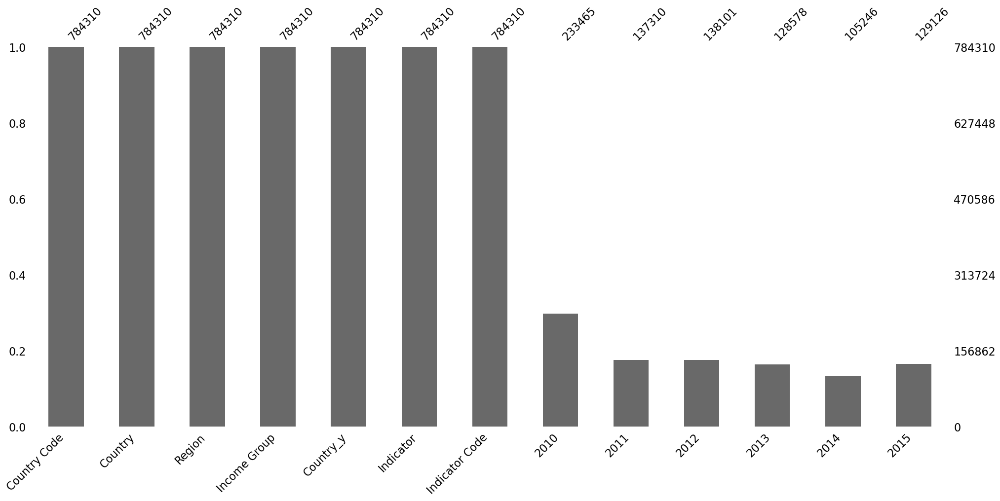

In [31]:
msno.bar(df1)

In [32]:
df1= pd.concat([df1.loc[:,['Region', 'Country','Country Code','Income Group','Indicator']],df1.loc[:,'2010':'2015']], axis=1)
display(df1.head(3), df1.shape)

,Region,Country,Country Code,Income Group,Indicator,2010,2011,2012,2013,2014,2015
0,Latin America & Caribbean,Aruba,ABW,High income: nonOECD,"Adjusted net enrolment rate, lower secondary, ...",NaN,78.047157,NaN,NaN,NaN,NaN
1,Latin America & Caribbean,Aruba,ABW,High income: nonOECD,"Adjusted net enrolment rate, lower secondary, ...",NaN,82.111633,NaN,NaN,NaN,NaN
2,Latin America & Caribbean,Aruba,ABW,High income: nonOECD,"Adjusted net enrolment rate, lower secondary, ...",NaN,1.108400,NaN,NaN,NaN,NaN


(784310, 11)

<AxesSubplot: >

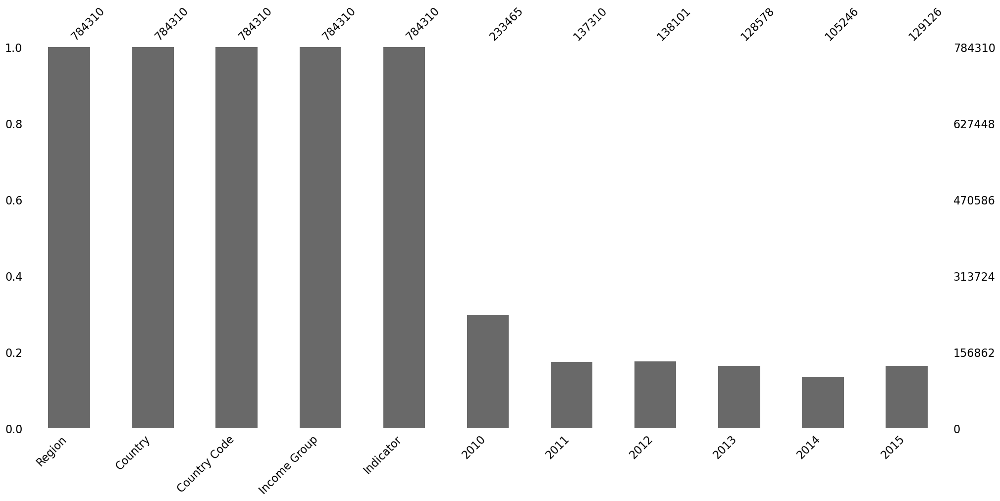

In [33]:
msno.bar(df1)

## 4.2 Selection des indicateurs pertinents

In [34]:
df1[df1['Indicator'].str.contains('Internet users')]['Indicator'].unique()

array(['Internet users (per 100 people)'], dtype=object)

<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
     <strong> Dan le fichier de données "Data" il y a 3665 Indicateurs, parmi eux nous avons ceux qui peuvent être intéressants pour notre modèle </strong>

<u>07 Expenditures </u>
- Government expenditure on education as % of GDP
- Government expenditure on secondary education as % of GDP (%) 
- Government expenditure on tertiary education as % of GDP (%)
- Government expenditure on upper secondary education as a percentage of GDP (%)
- Government expenditure per tertiary student as % of GDP per capita (%)

<u> 05 Tertiary</u>
- Enrolment in tertiary education, all programmes, both sexes (number)
- Enrolment in tertiary education per 100,000 inhabitants, both sexes


<u> 04 Vocational & Post-secondary Non-Tertiary </u>
- Gross enrolment ratio, post-secondary non-tertiary, both sexes (%)


<u> 12 Population </u>
-  Population, total
- School age population, secondary education, both sexes (number)
- School age population, tertiary education, both sexes (number)
- School age population, upper secondary education, both sexes (number)
- Population of the official age for tertiary education, both sexes (number)

 
 
<u>14 Background </u>
- GDP per capita (constant 2005 US$)
- GDP per capita, PPP (current international $)
- Internet users (per 100 people)
- Personal computers (per 100 people)


</div>



In [35]:
indicators= ['Population, total', 
             'Population growth (annual %)',
             'Population of the official age for tertiary education, both sexes (number)',
             'Internet users (per 100 people)',
             'GDP per capita (current US$)', 
             'GDP per capita, PPP (current international $)',
             'Government expenditure on education as % of GDP (%)', 
             'Government expenditure on tertiary education as % of GDP (%)', 
             'Government expenditure per tertiary student as % of GDP per capita (%)',
             'Enrolment in tertiary education, all programmes, both sexes (number)', 
             'Enrolment in tertiary education per 100,000 inhabitants, both sexes']

In [36]:

df_INDCTRS= df1[df1['Indicator'].isin(indicators)]
df_INDCTRS

,Region,Country,Country Code,Income Group,Indicator,2010,2011,2012,2013,2014,2015
1201,Latin America & Caribbean,Aruba,ABW,High income: nonOECD,"Enrolment in tertiary education per 100,000 in...",2.293375e+03,2.456443e+03,2.559745e+03,1.147482e+03,1.193917e+03,NaN
1204,Latin America & Caribbean,Aruba,ABW,High income: nonOECD,"Enrolment in tertiary education, all programme...",2.330000e+03,2.504000e+03,2.621000e+03,1.181000e+03,1.235000e+03,1.166000e+03
1245,Latin America & Caribbean,Aruba,ABW,High income: nonOECD,GDP per capita (current US$),2.427194e+04,2.532472e+04,NaN,NaN,NaN,NaN
1247,Latin America & Caribbean,Aruba,ABW,High income: nonOECD,"GDP per capita, PPP (current international $)",NaN,3.597378e+04,NaN,NaN,NaN,NaN
1260,Latin America & Caribbean,Aruba,ABW,High income: nonOECD,Government expenditure on education as % of GD...,6.712490e+00,6.036870e+00,6.549060e+00,6.808060e+00,6.162930e+00,NaN
...,...,...,...,...,...,...,...,...,...,...,...
781936,Sub-Saharan Africa,Zimbabwe,ZWE,Low income,Government expenditure per tertiary student as...,6.649595e+01,NaN,2.558296e+02,2.549167e+02,NaN,NaN
782020,Sub-Saharan Africa,Zimbabwe,ZWE,Low income,Internet users (per 100 people),6.400000e+00,8.400000e+00,1.200000e+01,1.550000e+01,1.636474e+01,2.274282e+01
782952,Sub-Saharan Africa,Zimbabwe,ZWE,Low income,Population growth (annual %),1.976756e+00,2.109672e+00,2.228306e+00,2.309366e+00,2.344799e+00,2.345643e+00
782971,Sub-Saharan Africa,Zimbabwe,ZWE,Low income,Population of the official age for tertiary ed...,1.602057e+06,1.601799e+06,1.601931e+06,1.602843e+06,1.604698e+06,1.607620e+06


In [37]:
#df_INDCTRS['Indicator'].unique().tolist()
df_INDCTRS['Indicator'].value_counts()

Enrolment in tertiary education per 100,000 inhabitants, both sexes           214
Enrolment in tertiary education, all programmes, both sexes (number)          214
GDP per capita (current US$)                                                  214
GDP per capita, PPP (current international $)                                 214
Government expenditure on education as % of GDP (%)                           214
Government expenditure on tertiary education as % of GDP (%)                  214
Government expenditure per tertiary student as % of GDP per capita (%)        214
Internet users (per 100 people)                                               214
Population growth (annual %)                                                  214
Population of the official age for tertiary education, both sexes (number)    214
Population, total                                                             214
Name: Indicator, dtype: int64

## 4.3 Restructuration de ma base de données principale

In [38]:
df_INDCTRS.columns

Index(['Region', 'Country', 'Country Code', 'Income Group', 'Indicator',
       '2010', '2011', '2012', '2013', '2014', '2015'],
      dtype='object')

In [39]:
df_final = df_INDCTRS.melt(id_vars=['Region', 'Country Code', 'Country', 'Income Group','Indicator'], var_name='Year')
df_final

,Region,Country Code,Country,Income Group,Indicator,Year,value
0,Latin America & Caribbean,ABW,Aruba,High income: nonOECD,"Enrolment in tertiary education per 100,000 in...",2010,2.293375e+03
1,Latin America & Caribbean,ABW,Aruba,High income: nonOECD,"Enrolment in tertiary education, all programme...",2010,2.330000e+03
2,Latin America & Caribbean,ABW,Aruba,High income: nonOECD,GDP per capita (current US$),2010,2.427194e+04
3,Latin America & Caribbean,ABW,Aruba,High income: nonOECD,"GDP per capita, PPP (current international $)",2010,NaN
4,Latin America & Caribbean,ABW,Aruba,High income: nonOECD,Government expenditure on education as % of GD...,2010,6.712490e+00
...,...,...,...,...,...,...,...
14119,Sub-Saharan Africa,ZWE,Zimbabwe,Low income,Government expenditure per tertiary student as...,2015,NaN
14120,Sub-Saharan Africa,ZWE,Zimbabwe,Low income,Internet users (per 100 people),2015,2.274282e+01
14121,Sub-Saharan Africa,ZWE,Zimbabwe,Low income,Population growth (annual %),2015,2.345643e+00
14122,Sub-Saharan Africa,ZWE,Zimbabwe,Low income,Population of the official age for tertiary ed...,2015,1.607620e+06


In [40]:
df_final.columns

Index(['Region', 'Country Code', 'Country', 'Income Group', 'Indicator',
       'Year', 'value'],
      dtype='object')

In [41]:
df_final = df_final.pivot_table(index=['Region', 'Country Code','Country', 'Year', 'Income Group'], columns='Indicator')
df_final

value  \
Indicator                                                                Enrolment in tertiary education per 100,000 inhabitants, both sexes   
Region              Country Code Country        Year Income Group                                                                              
East Asia & Pacific ASM          American Samoa 2010 Upper middle income                                                NaN                    
                                                2011 Upper middle income                                                NaN                    
                                                2012 Upper middle income                                                NaN                    
                                                2013 Upper middle income                                                NaN                    
                                                2014 Upper middle income                                                NaN                    
...                                                                                                                     ...                    
Sub-Saharan Africa  ZWE          Zimbabwe       2011 Low income                                                  654.374817                    
                                                2012 Low income                                                  645.443787                    
                                                2013 Low income                                                  631.725220                    
                                                2014 Low income                                                         NaN                    
                                                2015 Low income                                                         NaN                    

                                                                                                                                               \
Indicator                                                                Enrolment in tertiary education, all programmes, both sexes (number)   
Region              Country Code Country        Year Income Group                                                                               
East Asia & Pacific ASM          American Samoa 2010 Upper middle income                                                NaN                     
                                                2011 Upper middle income                                                NaN                     
                                                2012 Upper middle income                                                NaN                     
                                                2013 Upper middle income                                                NaN                     
                                                2014 Upper middle income                                                NaN                     
...                                                                                                                     ...                     
Sub-Saharan Africa  ZWE          Zimbabwe       2011 Low income                                                     93285.0                     
                                                2012 Low income                                                     94012.0                     
                                                2013 Low income                                                     94115.0                     
                                                2014 Low income                                                         NaN                     
                                                2015 Low income                                                    135575.0                     

                                                                                       

In [42]:
df_final.columns

MultiIndex([('value', ...),
            ('value', ...),
            ('value', ...),
            ('value', ...),
            ('value', ...),
            ('value', ...),
            ('value', ...),
            ('value', ...),
            ('value', ...),
            ('value', ...),
            ('value', ...)],
           names=[None, 'Indicator'])

In [43]:
df_final = df_final.reset_index()


In [44]:
df_final.columns

MultiIndex([(      'Region', ...),
            ('Country Code', ...),
            (     'Country', ...),
            (        'Year', ...),
            ('Income Group', ...),
            (       'value', ...),
            (       'value', ...),
            (       'value', ...),
            (       'value', ...),
            (       'value', ...),
            (       'value', ...),
            (       'value', ...),
            (       'value', ...),
            (       'value', ...),
            (       'value', ...),
            (       'value', ...)],
           names=[None, 'Indicator'])

In [45]:
df_final.head(1)

Region Country Code         Country  Year  \
Indicator                                                           
0          East Asia & Pacific          ASM  American Samoa  2010   

                  Income Group  \
Indicator                        
0          Upper middle income   

                                                                        value  \
Indicator Enrolment in tertiary education per 100,000 inhabitants, both sexes   
0                                                        NaN                    

                                                                                \
Indicator Enrolment in tertiary education, all programmes, both sexes (number)   
0                                                        NaN                     

                                        \
Indicator GDP per capita (current US$)   
0                         10352.822762   

                                                         \
Indicator GDP per capita, PPP (current international $)   
0                                                   NaN   

                                                               \
Indicator Government expenditure on education as % of GDP (%)   
0                                                        NaN    

                                                                        \
Indicator Government expenditure on tertiary education as % of GDP (%)   
0                                                        NaN             

                                                                                  \
Indicator Government expenditure per tertiary student as % of GDP per capita (%)   
0                                                        NaN                       

                                                                        \
Indicator Internet users (per 100 people) Population growth (annual %)   
0                                     NaN                    -1.054862   

                                                                                      \
Indicator Population of the official age for tertiary education, both sexes (number)   
0                                                        NaN                           

                             
Indicator Population, total  
0                   55637.0

In [46]:
df_final.columns = ['Region', 'Country code', 'Country', 'Year', 'Income group',
                    'Enrol. tert. per 100,000 inh', 
                    'Enrol. tert. all programs', 
                    'GDP per capita',
                    'GDP per capita, PPP', 
                    'Government expend. on edu as % of GDP (%)', 
                    'Government expend. on tert. edu as % of GDP (%)', 
                    'Government expend. per tert. studet as % of GDP (%)', 
                    'Internet users', 
                    'Population growth', 
                    'Population age for tert. edu.', 
                    'Population, total']


In [47]:
display(df_final.head(5), df_final.shape)

,Region,Country code,Country,Year,Income group,"Enrol. tert. per 100,000 inh",Enrol. tert. all programs,GDP per capita,"GDP per capita, PPP",Government expend. on edu as % of GDP (%),Government expend. on tert. edu as % of GDP (%),Government expend. per tert. studet as % of GDP (%),Internet users,Population growth,Population age for tert. edu.,"Population, total"
0,East Asia & Pacific,ASM,American Samoa,2010,Upper middle income,NaN,NaN,10352.822762,NaN,NaN,NaN,NaN,NaN,-1.054862,NaN,55637.0
1,East Asia & Pacific,ASM,American Samoa,2011,Upper middle income,NaN,NaN,10375.994215,NaN,NaN,NaN,NaN,NaN,-0.571394,NaN,55320.0
2,East Asia & Pacific,ASM,American Samoa,2012,Upper middle income,NaN,NaN,11660.329531,NaN,NaN,NaN,NaN,NaN,-0.162822,NaN,55230.0
3,East Asia & Pacific,ASM,American Samoa,2013,Upper middle income,NaN,NaN,11589.853002,NaN,NaN,NaN,NaN,NaN,0.139320,NaN,55307.0
4,East Asia & Pacific,ASM,American Samoa,2014,Upper middle income,NaN,NaN,11598.751736,NaN,NaN,NaN,NaN,NaN,0.234776,NaN,55437.0


(1281, 16)

## 4.4 Analyse et élimination des valeurs manquantes

<AxesSubplot: >

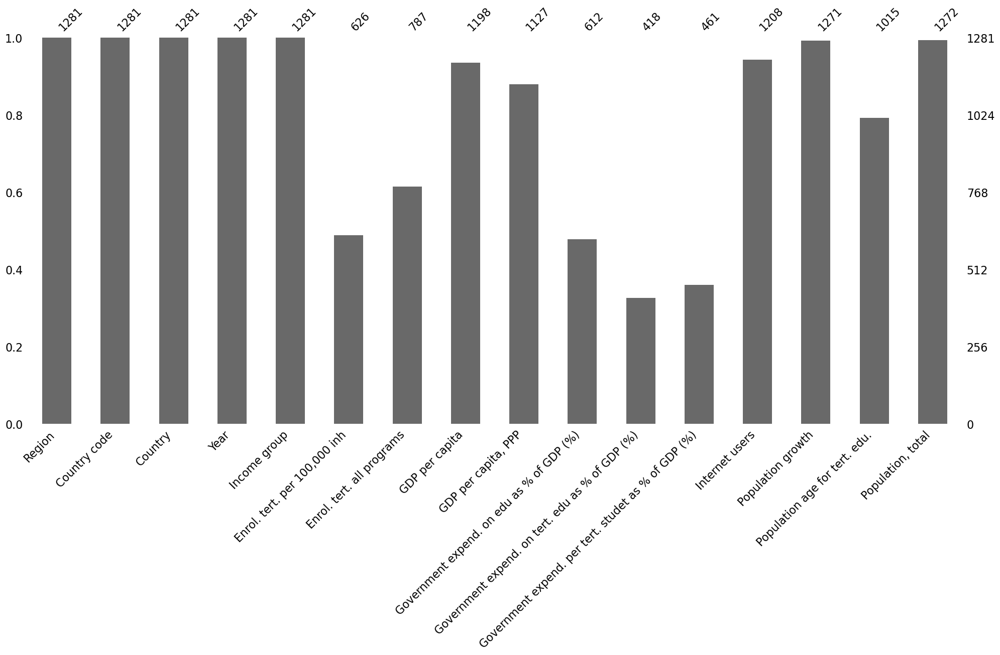

In [48]:
msno.bar(df_final)

In [49]:
#valeurs manquantes valeurs manquantes lors de l'utilisation de cette sélection d'indicateurs
valeurs_manquantes=((df_final.isna().sum()/df_final.shape[0])*100).sort_values(ascending=True)

In [50]:
valeurs_manquantes

Region                                                  0.000000
Country code                                            0.000000
Country                                                 0.000000
Year                                                    0.000000
Income group                                            0.000000
Population, total                                       0.702576
Population growth                                       0.780640
Internet users                                          5.698673
GDP per capita                                          6.479313
GDP per capita, PPP                                    12.021858
Population age for tert. edu.                          20.765027
Enrol. tert. all programs                              38.563622
Enrol. tert. per 100,000 inh                           51.131928
Government expend. on edu as % of GDP (%)              52.224824
Government expend. per tert. studet as % of GDP (%)    64.012490
Government expend. on ter

In [51]:
df_final.to_csv('df_final.csv', index=False)

### 4.4.1  Corrélation entre les indicateurs (En tant que stratégie pour réduire la dimensionnalité de l'analyse)

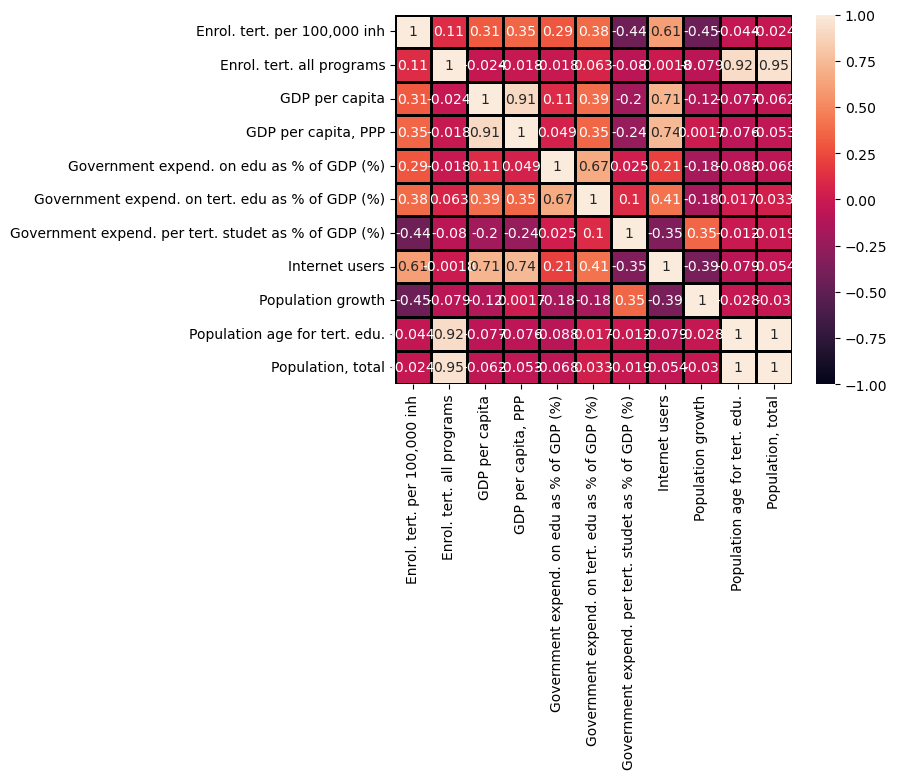

In [52]:
sns.heatmap(df_final.corr(), annot=True, linecolor='k', linewidths=2,vmin=-1, vmax=1)
plt.savefig("correlation-avant-imputation.png")
plt.show()


<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
    <p> <b>De cette analyse simple, nous pouvons rapidement remarquer qu'il existe une corrélation entre le "GDP per capita" et le "GDP per capita, PPP",  ainsi qu'entre "Population age for tert. edu." et "enrol.tert.all programs" et "Population age for tert. edu." et "Population, total". </b></p>
</div>       

In [53]:
df_final.loc[df_final['Country'] == 'France', ['Year','Population, total', 'Population age for tert. edu.', 'GDP per capita']] 

,Year,"Population, total",Population age for tert. edu.,GDP per capita
324,2010,65027512.0,3930005.0,40703.342791
325,2011,65342776.0,3893923.0,43810.200880
326,2012,65659790.0,3827966.0,40838.024437
327,2013,65998570.0,3762273.0,42554.122054
328,2014,66331957.0,3709990.0,42955.242866
329,2015,66624068.0,NaN,36526.770108


### 4.4.2 Analyse fractionnée par an 

###  📌 2010 


In [54]:
df_2010=df_final.loc[df_final['Year'] == '2010' , ['Region', 'Country code', 'Country', 'Year', 'Income group',
                    'Enrol. tert. per 100,000 inh', 
                    'Enrol. tert. all programs', 
                    'GDP per capita',
                    'GDP per capita, PPP', 
                    'Government expend. on edu as % of GDP (%)', 
                    'Government expend. on tert. edu as % of GDP (%)', 
                    'Government expend. per tert. studet as % of GDP (%)', 
                    'Internet users', 
                    'Population growth', 
                    'Population age for tert. edu.', 
                    'Population, total']]


In [55]:
display(df_2010.head(3), df_2010.shape)

,Region,Country code,Country,Year,Income group,"Enrol. tert. per 100,000 inh",Enrol. tert. all programs,GDP per capita,"GDP per capita, PPP",Government expend. on edu as % of GDP (%),Government expend. on tert. edu as % of GDP (%),Government expend. per tert. studet as % of GDP (%),Internet users,Population growth,Population age for tert. edu.,"Population, total"
0,East Asia & Pacific,ASM,American Samoa,2010,Upper middle income,NaN,NaN,10352.822762,NaN,NaN,NaN,NaN,NaN,-1.054862,NaN,55637.0
6,East Asia & Pacific,AUS,Australia,2010,High income: OECD,5759.580566,1276488.0,51874.080482,39191.035625,5.55523,1.24057,21.41188,76.0,1.555490,1577526.0,22031750.0
12,East Asia & Pacific,BRN,Brunei,2010,High income: nonOECD,1468.591553,5776.0,35268.101170,78923.390474,2.04661,0.49896,31.62561,53.0,1.266145,36896.0,388662.0


(214, 16)

In [56]:
dic_notna_2010=df_2010.notna().sum().to_dict()
dic_notna_2010

{'Region': 214,
 'Country code': 214,
 'Country': 214,
 'Year': 214,
 'Income group': 214,
 'Enrol. tert. per 100,000 inh': 136,
 'Enrol. tert. all programs': 140,
 'GDP per capita': 203,
 'GDP per capita, PPP': 190,
 'Government expend. on edu as % of GDP (%)': 127,
 'Government expend. on tert. edu as % of GDP (%)': 113,
 'Government expend. per tert. studet as % of GDP (%)': 96,
 'Internet users': 201,
 'Population growth': 214,
 'Population age for tert. edu.': 190,
 'Population, total': 214}

In [57]:
df_notna_2010=pd.DataFrame(dic_notna_2010.items(),columns=['Columns', '2010'])
df_notna_2010

,Columns,2010
0,Region,214
1,Country code,214
2,Country,214
3,Year,214
4,Income group,214
5,"Enrol. tert. per 100,000 inh",136
6,Enrol. tert. all programs,140
7,GDP per capita,203
8,"GDP per capita, PPP",190
9,Government expend. on edu as % of GDP (%),127


###  📌 2011


In [58]:
df_2011=df_final.loc[df_final['Year'] == '2011' , ['Region', 'Country code', 'Country', 'Year', 'Income group',
                    'Enrol. tert. per 100,000 inh', 
                    'Enrol. tert. all programs', 
                    'GDP per capita',
                    'GDP per capita, PPP', 
                    'Government expend. on edu as % of GDP (%)', 
                    'Government expend. on tert. edu as % of GDP (%)', 
                    'Government expend. per tert. studet as % of GDP (%)', 
                    'Internet users', 
                    'Population growth', 
                    'Population age for tert. edu.', 
                    'Population, total']]


In [59]:
dic_notna_2011=df_2011.notna().sum().to_dict()
df_notna_2011=pd.DataFrame(dic_notna_2011.items(),columns=['Columns', '2011'])
df_notna_2011

,Columns,2011
0,Region,214
1,Country code,214
2,Country,214
3,Year,214
4,Income group,214
5,"Enrol. tert. per 100,000 inh",138
6,Enrol. tert. all programs,142
7,GDP per capita,203
8,"GDP per capita, PPP",192
9,Government expend. on edu as % of GDP (%),121



###  📌 2012

In [60]:
df_2012=df_final.loc[df_final['Year'] == '2012' , ['Region', 'Country code', 'Country', 'Year', 'Income group',
                    'Enrol. tert. per 100,000 inh', 
                    'Enrol. tert. all programs', 
                    'GDP per capita',
                    'GDP per capita, PPP', 
                    'Government expend. on edu as % of GDP (%)', 
                    'Government expend. on tert. edu as % of GDP (%)', 
                    'Government expend. per tert. studet as % of GDP (%)', 
                    'Internet users', 
                    'Population growth', 
                    'Population age for tert. edu.', 
                    'Population, total']]

In [61]:
dic_notna_2012=df_2012.notna().sum().to_dict()
df_notna_2012=pd.DataFrame(dic_notna_2012.items(),columns=['Columns', '2012'])
df_notna_2012

,Columns,2012
0,Region,214
1,Country code,214
2,Country,214
3,Year,214
4,Income group,214
5,"Enrol. tert. per 100,000 inh",132
6,Enrol. tert. all programs,141
7,GDP per capita,199
8,"GDP per capita, PPP",188
9,Government expend. on edu as % of GDP (%),113


###  📌 2013

In [62]:
df_2013=df_final.loc[df_final['Year'] == '2013' , ['Region', 'Country code', 'Country', 'Year', 'Income group',
                    'Enrol. tert. per 100,000 inh', 
                    'Enrol. tert. all programs', 
                    'GDP per capita',
                    'GDP per capita, PPP', 
                    'Government expend. on edu as % of GDP (%)', 
                    'Government expend. on tert. edu as % of GDP (%)', 
                    'Government expend. per tert. studet as % of GDP (%)', 
                    'Internet users', 
                    'Population growth', 
                    'Population age for tert. edu.', 
                    'Population, total']]


In [63]:
dic_notna_2013=df_2013.notna().sum().to_dict()
df_notna_2013=pd.DataFrame(dic_notna_2013.items(),columns=['Columns', '2013'])
df_notna_2013

,Columns,2013
0,Region,214
1,Country code,214
2,Country,214
3,Year,214
4,Income group,214
5,"Enrol. tert. per 100,000 inh",123
6,Enrol. tert. all programs,131
7,GDP per capita,200
8,"GDP per capita, PPP",188
9,Government expend. on edu as % of GDP (%),118


###  📌 2014

In [64]:
df_2014=df_final.loc[df_final['Year'] == '2014' , ['Region', 'Country code', 'Country', 'Year', 'Income group',
                    'Enrol. tert. per 100,000 inh', 
                    'Enrol. tert. all programs', 
                    'GDP per capita',
                    'GDP per capita, PPP', 
                    'Government expend. on edu as % of GDP (%)', 
                    'Government expend. on tert. edu as % of GDP (%)', 
                    'Government expend. per tert. studet as % of GDP (%)', 
                    'Internet users', 
                    'Population growth', 
                    'Population age for tert. edu.', 
                    'Population, total']]

In [65]:
dic_notna_2014=df_2014.notna().sum().to_dict()
df_notna_2014=pd.DataFrame(dic_notna_2014.items(),columns=['Columns', '2014'])
df_notna_2014

,Columns,2014
0,Region,213
1,Country code,213
2,Country,213
3,Year,213
4,Income group,213
5,"Enrol. tert. per 100,000 inh",93
6,Enrol. tert. all programs,124
7,GDP per capita,197
8,"GDP per capita, PPP",185
9,Government expend. on edu as % of GDP (%),89


###  📌 2015

In [66]:
df_2015=df_final.loc[df_final['Year'] == '2015' , ['Region', 'Country code', 'Country', 'Year', 'Income group',
                    'Enrol. tert. per 100,000 inh', 
                    'Enrol. tert. all programs', 
                    'GDP per capita',
                    'GDP per capita, PPP', 
                    'Government expend. on edu as % of GDP (%)', 
                    'Government expend. on tert. edu as % of GDP (%)', 
                    'Government expend. per tert. studet as % of GDP (%)', 
                    'Internet users', 
                    'Population growth', 
                    'Population age for tert. edu.', 
                    'Population, total']]

In [67]:
dic_notna_2015=df_2015.notna().sum().to_dict()
df_notna_2015=pd.DataFrame(dic_notna_2015.items(),columns=['Columns', '2015'])
df_notna_2015

,Columns,2015
0,Region,212
1,Country code,212
2,Country,212
3,Year,212
4,Income group,212
5,"Enrol. tert. per 100,000 inh",4
6,Enrol. tert. all programs,109
7,GDP per capita,196
8,"GDP per capita, PPP",184
9,Government expend. on edu as % of GDP (%),44


In [68]:
dfs=[df_notna_2010, df_notna_2011, df_notna_2012, df_notna_2013, df_notna_2014, df_notna_2015]


In [69]:
import functools as ft
##pd.merge(df_notna_2010, df_notna_2015, on='Columns')

dts_notna_annes = ft.reduce(lambda left, right: pd.merge(left, right, on='Columns'), dfs)

In [70]:
dts_notna_annes

,Columns,2010,2011,2012,2013,2014,2015
0,Region,214,214,214,214,213,212
1,Country code,214,214,214,214,213,212
2,Country,214,214,214,214,213,212
3,Year,214,214,214,214,213,212
4,Income group,214,214,214,214,213,212
5,"Enrol. tert. per 100,000 inh",136,138,132,123,93,4
6,Enrol. tert. all programs,140,142,141,131,124,109
7,GDP per capita,203,203,199,200,197,196
8,"GDP per capita, PPP",190,192,188,188,185,184
9,Government expend. on edu as % of GDP (%),127,121,113,118,89,44


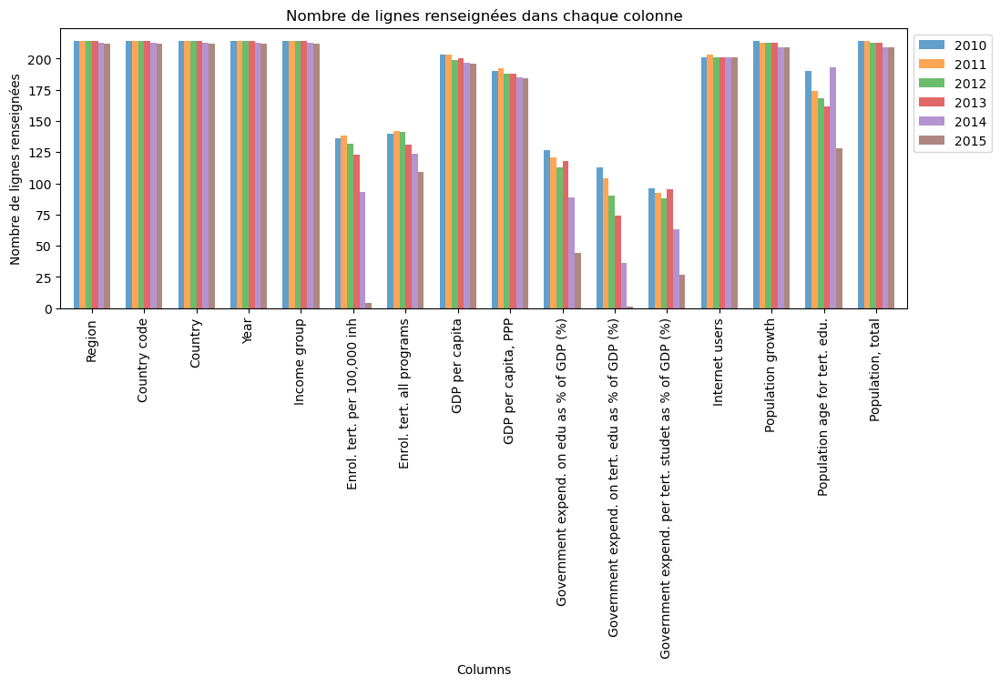

In [71]:
# plot grouped bar chart

dts_notna_annes.plot(x='Columns',
        kind='bar',
        stacked=False, width = 0.7, alpha=0.7, figsize=(12,4))


plt.xlabel('Columns')
plt.ylabel('Nombre de lignes renseignées')
plt.title('Nombre de lignes renseignées dans chaque colonne')
plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')

plt.savefig("Missing_Values_per_year.png")

plt.show()



<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
    <p> <b>Étant donné que mon indicateur discriminant (le plus important) est l'accès à Internet et que cette colonne est presque également complète toutes les années, j'utiliserai la colonne âge de la population pour l'éducation tertiaire comme deuxième critère pour sélectionner les années à comparer. Dans ce cas je comparerai l'évolution de mes indicateurs en analysant les années 2010 et 2013...</b></p>
</div>       

In [72]:
df_2010[df_2010['Internet users'].isnull()]['Country'].unique()

array(['American Samoa', 'Northern Mariana Islands', 'Palau',
       'Channel Islands', 'Isle of Man', 'San Marino', 'Kosovo',
       'Curaçao', 'St. Martin (French part)', 'Sint Maarten (Dutch part)',
       'Turks and Caicos Islands', 'Somalia', 'South Sudan'], dtype=object)

In [73]:
df_2013[df_2013['Internet users'].isnull()]['Country'].unique()

array(['American Samoa', 'Northern Mariana Islands', 'Palau',
       "Dem. People's Rep. Korea", 'Channel Islands', 'Isle of Man',
       'San Marino', 'Kosovo', 'Curaçao', 'St. Martin (French part)',
       'Sint Maarten (Dutch part)', 'Turks and Caicos Islands',
       'South Sudan'], dtype=object)

<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
    <p> <b>  Comme les pays qui ne disposent pas d'informations sur l'accès à Internet ne sont pas très intéressants pour notre analyse, nous pouvons simplement les éliminer dans le deux dataframes</b></p>
</div>       

### 4.4.3 Élimination des valeurs manquantes dans les années d'intérêt (2010 et 2013)

####  🔵 2010

In [74]:
df_2010.isna().sum()

Region                                                   0
Country code                                             0
Country                                                  0
Year                                                     0
Income group                                             0
Enrol. tert. per 100,000 inh                            78
Enrol. tert. all programs                               74
GDP per capita                                          11
GDP per capita, PPP                                     24
Government expend. on edu as % of GDP (%)               87
Government expend. on tert. edu as % of GDP (%)        101
Government expend. per tert. studet as % of GDP (%)    118
Internet users                                          13
Population growth                                        0
Population age for tert. edu.                           24
Population, total                                        0
dtype: int64

In [75]:
df_2010=df_2010.dropna(subset=['Internet users'])
df_2010.isna().sum()

Region                                                   0
Country code                                             0
Country                                                  0
Year                                                     0
Income group                                             0
Enrol. tert. per 100,000 inh                            66
Enrol. tert. all programs                               63
GDP per capita                                           5
GDP per capita, PPP                                     15
Government expend. on edu as % of GDP (%)               75
Government expend. on tert. edu as % of GDP (%)         89
Government expend. per tert. studet as % of GDP (%)    106
Internet users                                           0
Population growth                                        0
Population age for tert. edu.                           16
Population, total                                        0
dtype: int64

In [76]:
df_2010[df_2010['GDP per capita'].isnull()]['Country'].unique()

array(['New Caledonia', "Dem. People's Rep. Korea", 'French Polynesia',
       'Cayman Islands', 'Syrian Arab Republic'], dtype=object)

In [77]:
df_2010=df_2010.dropna(subset=['GDP per capita'])
df_2010.isna().sum()

Region                                                   0
Country code                                             0
Country                                                  0
Year                                                     0
Income group                                             0
Enrol. tert. per 100,000 inh                            62
Enrol. tert. all programs                               59
GDP per capita                                           0
GDP per capita, PPP                                     10
Government expend. on edu as % of GDP (%)               70
Government expend. on tert. edu as % of GDP (%)         84
Government expend. per tert. studet as % of GDP (%)    101
Internet users                                           0
Population growth                                        0
Population age for tert. edu.                           13
Population, total                                        0
dtype: int64

In [78]:
df_2010[df_2010['GDP per capita, PPP'].isnull()]['Country'].unique()

array(['Guam', 'Andorra', 'Faeroe Islands', 'Greenland', 'Liechtenstein',
       'Monaco', 'Aruba', 'Cuba', 'Virgin Islands', 'West Bank and Gaza'],
      dtype=object)

In [79]:
df_2010=df_2010.dropna(subset=['GDP per capita, PPP'])
df_2010.isna().sum()

Region                                                  0
Country code                                            0
Country                                                 0
Year                                                    0
Income group                                            0
Enrol. tert. per 100,000 inh                           56
Enrol. tert. all programs                              53
GDP per capita                                          0
GDP per capita, PPP                                     0
Government expend. on edu as % of GDP (%)              65
Government expend. on tert. edu as % of GDP (%)        75
Government expend. per tert. studet as % of GDP (%)    91
Internet users                                          0
Population growth                                       0
Population age for tert. edu.                           7
Population, total                                       0
dtype: int64

In [80]:
df_2010['Country'].tolist()

['Australia',
 'Brunei',
 'China',
 'Fiji',
 'Micronesia',
 'Hong Kong SAR, China',
 'Indonesia',
 'Japan',
 'Cambodia',
 'Kiribati',
 'Korea',
 'Lao PDR',
 'Macao SAR, China',
 'Marshall Islands',
 'Myanmar',
 'Mongolia',
 'Malaysia',
 'New Zealand',
 'Philippines',
 'Papua New Guinea',
 'Singapore',
 'Solomon Islands',
 'Thailand',
 'Timor-Leste',
 'Tonga',
 'Tuvalu',
 'Vietnam',
 'Vanuatu',
 'Samoa',
 'Albania',
 'Armenia',
 'Austria',
 'Azerbaijan',
 'Belgium',
 'Bulgaria',
 'Bosnia and Herzegovina',
 'Belarus',
 'Switzerland',
 'Cyprus',
 'Czech Republic',
 'Germany',
 'Denmark',
 'Spain',
 'Estonia',
 'Finland',
 'France',
 'United Kingdom',
 'Georgia',
 'Greece',
 'Croatia',
 'Hungary',
 'Ireland',
 'Iceland',
 'Italy',
 'Kazakhstan',
 'Kyrgyz Republic',
 'Lithuania',
 'Luxembourg',
 'Latvia',
 'Moldova',
 'Macedonia',
 'Montenegro',
 'Netherlands',
 'Norway',
 'Poland',
 'Portugal',
 'Romania',
 'Russia',
 'Serbia',
 'Slovak Republic',
 'Slovenia',
 'Sweden',
 'Tajikistan',
 'T

In [81]:
display(df_2010.head(5), df_2010.shape)

,Region,Country code,Country,Year,Income group,"Enrol. tert. per 100,000 inh",Enrol. tert. all programs,GDP per capita,"GDP per capita, PPP",Government expend. on edu as % of GDP (%),Government expend. on tert. edu as % of GDP (%),Government expend. per tert. studet as % of GDP (%),Internet users,Population growth,Population age for tert. edu.,"Population, total"
6,East Asia & Pacific,AUS,Australia,2010,High income: OECD,5759.580566,1276488.0,51874.080482,39191.035625,5.55523,1.24057,21.41188,76.0,1.555490,1577526.0,2.203175e+07
12,East Asia & Pacific,BRN,Brunei,2010,High income: nonOECD,1468.591553,5776.0,35268.101170,78923.390474,2.04661,0.49896,31.62561,53.0,1.266145,36896.0,3.886620e+05
18,East Asia & Pacific,CHN,China,2010,Upper middle income,2315.246826,31046736.0,4560.512586,9333.124237,NaN,NaN,NaN,34.3,0.482960,129642728.0,1.337705e+09
24,East Asia & Pacific,FJI,Fiji,2010,Upper middle income,NaN,NaN,3651.966784,7203.365693,NaN,NaN,NaN,20.0,0.932645,77469.0,8.599500e+05
30,East Asia & Pacific,FSM,Micronesia,2010,Lower middle income,NaN,NaN,2861.771348,3230.949855,NaN,NaN,NaN,20.0,-0.331445,12030.0,1.036160e+05


(186, 16)

In [82]:
df_2010.columns

Index(['Region', 'Country code', 'Country', 'Year', 'Income group',
       'Enrol. tert. per 100,000 inh', 'Enrol. tert. all programs',
       'GDP per capita', 'GDP per capita, PPP',
       'Government expend. on edu as % of GDP (%)',
       'Government expend. on tert. edu as % of GDP (%)',
       'Government expend. per tert. studet as % of GDP (%)', 'Internet users',
       'Population growth', 'Population age for tert. edu.',
       'Population, total'],
      dtype='object')

In [83]:
df_2010=df_2010[['Region', 'Country code', 'Country', 'Year', 'Income group','GDP per capita', 'GDP per capita, PPP', 'Internet users', 'Population growth', 'Population age for tert. edu.',
       'Population, total']]
df_2010

,Region,Country code,Country,Year,Income group,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
6,East Asia & Pacific,AUS,Australia,2010,High income: OECD,51874.080482,39191.035625,76.0,1.555490,1577526.0,2.203175e+07
12,East Asia & Pacific,BRN,Brunei,2010,High income: nonOECD,35268.101170,78923.390474,53.0,1.266145,36896.0,3.886620e+05
18,East Asia & Pacific,CHN,China,2010,Upper middle income,4560.512586,9333.124237,34.3,0.482960,129642728.0,1.337705e+09
24,East Asia & Pacific,FJI,Fiji,2010,Upper middle income,3651.966784,7203.365693,20.0,0.932645,77469.0,8.599500e+05
30,East Asia & Pacific,FSM,Micronesia,2010,Lower middle income,2861.771348,3230.949855,20.0,-0.331445,12030.0,1.036160e+05
...,...,...,...,...,...,...,...,...,...,...,...
1251,Sub-Saharan Africa,TZA,Tanzania,2010,Low income,701.604550,2048.293593,2.9,3.160941,3994838.0,4.609859e+07
1257,Sub-Saharan Africa,UGA,Uganda,2010,Low income,595.206173,1485.202679,12.5,3.429003,3014924.0,3.391513e+07
1263,Sub-Saharan Africa,ZAF,South Africa,2010,Upper middle income,7361.755850,11785.605136,24.0,1.429604,5368882.0,5.097943e+07
1269,Sub-Saharan Africa,ZMB,Zambia,2010,Lower middle income,1463.213573,3212.941881,10.0,2.883152,1361124.0,1.385003e+07


<AxesSubplot: >

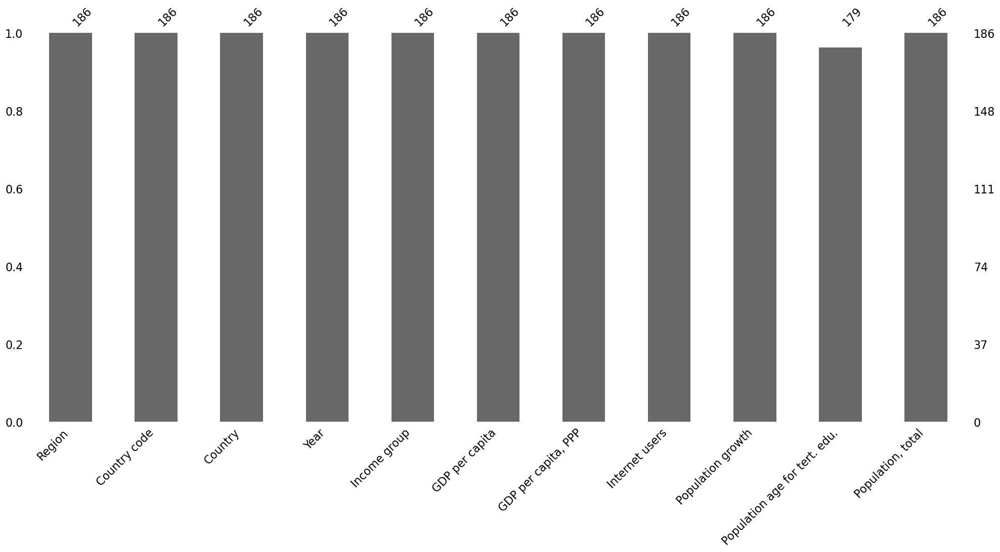

In [84]:
msno.bar(df_2010)

In [85]:
df_2010.notna().sum()

Region                           186
Country code                     186
Country                          186
Year                             186
Income group                     186
GDP per capita                   186
GDP per capita, PPP              186
Internet users                   186
Population growth                186
Population age for tert. edu.    179
Population, total                186
dtype: int64

#### 🔵 2013

In [86]:
df_2013.isna().sum()

Region                                                   0
Country code                                             0
Country                                                  0
Year                                                     0
Income group                                             0
Enrol. tert. per 100,000 inh                            91
Enrol. tert. all programs                               83
GDP per capita                                          14
GDP per capita, PPP                                     26
Government expend. on edu as % of GDP (%)               96
Government expend. on tert. edu as % of GDP (%)        140
Government expend. per tert. studet as % of GDP (%)    119
Internet users                                          13
Population growth                                        1
Population age for tert. edu.                           52
Population, total                                        1
dtype: int64

In [87]:
df_2013=df_2013.dropna(subset=['Internet users'])
df_2013.isna().sum()

Region                                                   0
Country code                                             0
Country                                                  0
Year                                                     0
Income group                                             0
Enrol. tert. per 100,000 inh                            80
Enrol. tert. all programs                               72
GDP per capita                                           8
GDP per capita, PPP                                     17
Government expend. on edu as % of GDP (%)               85
Government expend. on tert. edu as % of GDP (%)        128
Government expend. per tert. studet as % of GDP (%)    107
Internet users                                           0
Population growth                                        1
Population age for tert. edu.                           42
Population, total                                        1
dtype: int64

In [88]:
df_2013[df_2013['GDP per capita'].isnull()]['Country'].unique()

array(['New Caledonia', 'French Polynesia', 'Monaco', 'Aruba',
       'Cayman Islands', 'Libya', 'Syrian Arab Republic', 'Eritrea'],
      dtype=object)

In [89]:
df_2013=df_2013.dropna(subset=['GDP per capita'])
df_2013.isna().sum()

Region                                                   0
Country code                                             0
Country                                                  0
Year                                                     0
Income group                                             0
Enrol. tert. per 100,000 inh                            74
Enrol. tert. all programs                               66
GDP per capita                                           0
GDP per capita, PPP                                      9
Government expend. on edu as % of GDP (%)               79
Government expend. on tert. edu as % of GDP (%)        120
Government expend. per tert. studet as % of GDP (%)    100
Internet users                                           0
Population growth                                        0
Population age for tert. edu.                           36
Population, total                                        0
dtype: int64

In [90]:
df_2013[df_2013['GDP per capita, PPP'].isnull()]['Country'].unique()

array(['Guam', 'Andorra', 'Faeroe Islands', 'Greenland', 'Liechtenstein',
       'Cuba', 'Virgin Islands', 'West Bank and Gaza', 'Somalia'],
      dtype=object)

In [91]:
df_2013=df_2013.dropna(subset=['GDP per capita, PPP'])
df_2013.isna().sum()

Region                                                   0
Country code                                             0
Country                                                  0
Year                                                     0
Income group                                             0
Enrol. tert. per 100,000 inh                            67
Enrol. tert. all programs                               60
GDP per capita                                           0
GDP per capita, PPP                                      0
Government expend. on edu as % of GDP (%)               72
Government expend. on tert. edu as % of GDP (%)        112
Government expend. per tert. studet as % of GDP (%)     92
Internet users                                           0
Population growth                                        0
Population age for tert. edu.                           30
Population, total                                        0
dtype: int64

In [92]:
df_2013.notna().sum()

Region                                                 184
Country code                                           184
Country                                                184
Year                                                   184
Income group                                           184
Enrol. tert. per 100,000 inh                           117
Enrol. tert. all programs                              124
GDP per capita                                         184
GDP per capita, PPP                                    184
Government expend. on edu as % of GDP (%)              112
Government expend. on tert. edu as % of GDP (%)         72
Government expend. per tert. studet as % of GDP (%)     92
Internet users                                         184
Population growth                                      184
Population age for tert. edu.                          154
Population, total                                      184
dtype: int64

In [93]:
df_2013['Country'].tolist()

['Australia',
 'Brunei',
 'China',
 'Fiji',
 'Micronesia',
 'Hong Kong SAR, China',
 'Indonesia',
 'Japan',
 'Cambodia',
 'Kiribati',
 'Korea',
 'Lao PDR',
 'Macao SAR, China',
 'Marshall Islands',
 'Myanmar',
 'Mongolia',
 'Malaysia',
 'New Zealand',
 'Philippines',
 'Papua New Guinea',
 'Singapore',
 'Solomon Islands',
 'Thailand',
 'Timor-Leste',
 'Tonga',
 'Tuvalu',
 'Vietnam',
 'Vanuatu',
 'Samoa',
 'Albania',
 'Armenia',
 'Austria',
 'Azerbaijan',
 'Belgium',
 'Bulgaria',
 'Bosnia and Herzegovina',
 'Belarus',
 'Switzerland',
 'Cyprus',
 'Czech Republic',
 'Germany',
 'Denmark',
 'Spain',
 'Estonia',
 'Finland',
 'France',
 'United Kingdom',
 'Georgia',
 'Greece',
 'Croatia',
 'Hungary',
 'Ireland',
 'Iceland',
 'Italy',
 'Kazakhstan',
 'Kyrgyz Republic',
 'Lithuania',
 'Luxembourg',
 'Latvia',
 'Moldova',
 'Macedonia',
 'Montenegro',
 'Netherlands',
 'Norway',
 'Poland',
 'Portugal',
 'Romania',
 'Russia',
 'Serbia',
 'Slovak Republic',
 'Slovenia',
 'Sweden',
 'Tajikistan',
 'T

In [94]:
df_2013=df_2013[['Region', 'Country code', 'Country', 'Year', 'Income group','GDP per capita', 'GDP per capita, PPP', 'Internet users', 'Population growth', 'Population age for tert. edu.',
       'Population, total']]
df_2013

,Region,Country code,Country,Year,Income group,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
9,East Asia & Pacific,AUS,Australia,2013,High income: OECD,67792.303862,45668.689114,83.453497,1.697473,1606476.0,2.311735e+07
15,East Asia & Pacific,BRN,Brunei,2013,High income: nonOECD,44597.279682,81827.273461,64.500000,1.481906,36223.0,4.057160e+05
21,East Asia & Pacific,CHN,China,2013,Upper middle income,7077.770765,12367.965009,45.800000,0.493710,113027008.0,1.357380e+09
27,East Asia & Pacific,FJI,Fiji,2013,Upper middle income,4763.068956,8113.236154,35.200000,0.697997,NaN,8.797150e+05
33,East Asia & Pacific,FSM,Micronesia,2013,Lower middle income,3047.584425,3320.563480,27.800000,0.192080,NaN,1.037020e+05
...,...,...,...,...,...,...,...,...,...,...,...
1254,Sub-Saharan Africa,TZA,Tanzania,2013,Low income,901.731430,2397.212978,4.400000,3.116185,4339127.0,5.063660e+07
1260,Sub-Saharan Africa,UGA,Uganda,2013,Low income,655.049607,1666.976794,15.500000,3.376766,3351920.0,3.755373e+07
1266,Sub-Saharan Africa,ZAF,South Africa,2013,Upper middle income,6880.445673,12879.591337,46.500000,1.522336,5266763.0,5.331196e+07
1272,Sub-Saharan Africa,ZMB,Zambia,2013,Lower middle income,1850.793359,3701.392674,15.400000,3.036918,1458724.0,1.515321e+07


<AxesSubplot: >

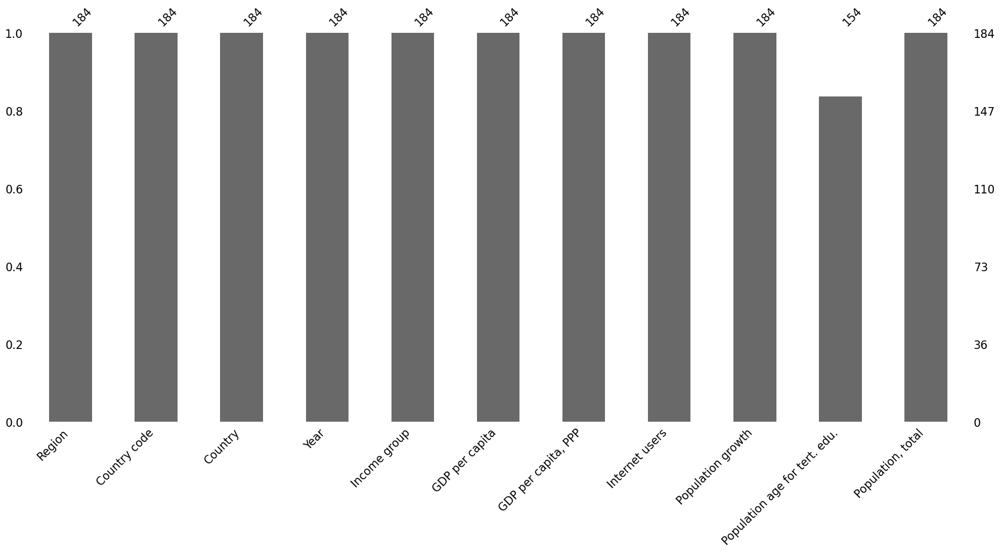

In [95]:
msno.bar(df_2013)

<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
    <p> <b> Après suppression des pays qui ne disposent pas des informations concernant Internet ou le PIB par habitant (GDP per capita), le mois des bases de données des donneurs (de 2010 et 2013) sont presque complètes avec les informations. La seule colonne ou indicateur qui n'est pas tout à fait complet est "Population age for tert edu. Pour le compléter, il est nécessaire de trouver une méthode appropriée qui ne modifie pas la distribution de mes données.</b></p>
</div>      

### 4.4.4  Imputation des valeurs manquantes  
(Une stratégie pour déduire les valeurs manquantes de la partie connue des données) 


#### 4.4.4.1 Nearest neighbors imputation¶


####  🔵 2010

In [96]:
df_2010_to_impute=df_2010[['GDP per capita', 'GDP per capita, PPP', 'Internet users',
       'Population growth', 'Population age for tert. edu.',
       'Population, total']]
df_2010_to_impute.head(3)

,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
6,51874.080482,39191.035625,76.0,1.555490,1577526.0,2.203175e+07
12,35268.101170,78923.390474,53.0,1.266145,36896.0,3.886620e+05
18,4560.512586,9333.124237,34.3,0.482960,129642728.0,1.337705e+09


In [97]:
knnimputer=KNNImputer(n_neighbors=3, weights="uniform")

imputed_data2010 = knnimputer.fit_transform(df_2010_to_impute)  # impute all the missing data from year 2010
df_imputed2010 = pd.DataFrame(imputed_data2010)
df_imputed2010.columns = df_2010_to_impute.columns
df_imputed2010.head(3)

,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
0,51874.080482,39191.035625,76.0,1.555490,1577526.0,2.203175e+07
1,35268.101170,78923.390474,53.0,1.266145,36896.0,3.886620e+05
2,4560.512586,9333.124237,34.3,0.482960,129642728.0,1.337705e+09


##### Comparaison de la distribution des données avant et après l'imputation


In [98]:
df_2010_to_impute.describe(include="float64") # distribution des données avant l'imputation


,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
count,186.000000,186.000000,186.000000,186.000000,1.790000e+02,1.860000e+02
mean,13060.592476,16903.641003,32.812128,1.513070,3.302299e+06,3.667176e+07
std,18710.583669,19343.796811,27.235012,1.554195,1.322343e+07,1.373343e+08
min,231.194326,597.076987,0.250000,-2.096943,1.041000e+03,1.053100e+04
25%,1336.630181,3235.681624,8.000000,0.488047,1.496395e+05,2.021287e+06
50%,4636.065701,9748.227220,27.935000,1.318020,6.200620e+05,7.343518e+06
75%,14405.017226,21611.711818,52.742500,2.302492,2.351155e+06,2.443943e+07
max,104965.306078,122609.410776,93.390000,11.220686,1.296427e+08,1.337705e+09


In [99]:
df_imputed2010.describe(include="float64") # distribution des données après l'imputation


,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
count,186.000000,186.000000,186.000000,186.000000,1.860000e+02,1.860000e+02
mean,13060.592476,16903.641003,32.812128,1.513070,3.276816e+06,3.667176e+07
std,18710.583669,19343.796811,27.235012,1.554195,1.301433e+07,1.373343e+08
min,231.194326,597.076987,0.250000,-2.096943,1.041000e+03,1.053100e+04
25%,1336.630181,3235.681624,8.000000,0.488047,1.580828e+05,2.021287e+06
50%,4636.065701,9748.227220,27.935000,1.318020,6.100670e+05,7.343518e+06
75%,14405.017226,21611.711818,52.742500,2.302492,2.312901e+06,2.443943e+07
max,104965.306078,122609.410776,93.390000,11.220686,1.296427e+08,1.337705e+09


####  --> Regroupement des colonnes dans les dataframes 2010 après imputation

In [100]:
display(df_2010.head(2), df_2010.shape)

,Region,Country code,Country,Year,Income group,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
6,East Asia & Pacific,AUS,Australia,2010,High income: OECD,51874.080482,39191.035625,76.0,1.555490,1577526.0,22031750.0
12,East Asia & Pacific,BRN,Brunei,2010,High income: nonOECD,35268.101170,78923.390474,53.0,1.266145,36896.0,388662.0


(186, 11)

In [101]:
display(df_imputed2010.head(2), df_imputed2010.shape)

,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
0,51874.080482,39191.035625,76.0,1.555490,1577526.0,22031750.0
1,35268.101170,78923.390474,53.0,1.266145,36896.0,388662.0


(186, 6)

In [102]:
df2010_final = df_2010.merge(df_imputed2010, on=['GDP per capita'], how='inner')
df2010_final.columns

Index(['Region', 'Country code', 'Country', 'Year', 'Income group',
       'GDP per capita', 'GDP per capita, PPP_x', 'Internet users_x',
       'Population growth_x', 'Population age for tert. edu._x',
       'Population, total_x', 'GDP per capita, PPP_y', 'Internet users_y',
       'Population growth_y', 'Population age for tert. edu._y',
       'Population, total_y'],
      dtype='object')

In [103]:
df2010_final=df2010_final.drop(columns=['GDP per capita, PPP_x', 'Internet users_x',
       'Population growth_x', 'Population age for tert. edu._x',
       'Population, total_x'])
df2010_final.head(3)

,Region,Country code,Country,Year,Income group,GDP per capita,"GDP per capita, PPP_y",Internet users_y,Population growth_y,Population age for tert. edu._y,"Population, total_y"
0,East Asia & Pacific,AUS,Australia,2010,High income: OECD,51874.080482,39191.035625,76.0,1.555490,1577526.0,2.203175e+07
1,East Asia & Pacific,BRN,Brunei,2010,High income: nonOECD,35268.101170,78923.390474,53.0,1.266145,36896.0,3.886620e+05
2,East Asia & Pacific,CHN,China,2010,Upper middle income,4560.512586,9333.124237,34.3,0.482960,129642728.0,1.337705e+09


In [104]:
df2010_final.head(3)

,Region,Country code,Country,Year,Income group,GDP per capita,"GDP per capita, PPP_y",Internet users_y,Population growth_y,Population age for tert. edu._y,"Population, total_y"
0,East Asia & Pacific,AUS,Australia,2010,High income: OECD,51874.080482,39191.035625,76.0,1.555490,1577526.0,2.203175e+07
1,East Asia & Pacific,BRN,Brunei,2010,High income: nonOECD,35268.101170,78923.390474,53.0,1.266145,36896.0,3.886620e+05
2,East Asia & Pacific,CHN,China,2010,Upper middle income,4560.512586,9333.124237,34.3,0.482960,129642728.0,1.337705e+09


In [105]:
df2010_final=df2010_final.rename(columns={"GDP per capita": "NY.GDP.PCAP.CD",
                               "GDP per capita, PPP_y": "NY.GDP.PCAP.PP.CD", 
                               "Internet users_y": "IT.NET.USER.P2", 
                              "Population growth_y": "SP.POP.GROW",
                              "Population age for tert. edu._y": "SP.TER.TOTL.IN",
                              "Population, total_y": "SP.POP.TOTL" })
df2010_final.head(3)

,Region,Country code,Country,Year,Income group,NY.GDP.PCAP.CD,NY.GDP.PCAP.PP.CD,IT.NET.USER.P2,SP.POP.GROW,SP.TER.TOTL.IN,SP.POP.TOTL
0,East Asia & Pacific,AUS,Australia,2010,High income: OECD,51874.080482,39191.035625,76.0,1.555490,1577526.0,2.203175e+07
1,East Asia & Pacific,BRN,Brunei,2010,High income: nonOECD,35268.101170,78923.390474,53.0,1.266145,36896.0,3.886620e+05
2,East Asia & Pacific,CHN,China,2010,Upper middle income,4560.512586,9333.124237,34.3,0.482960,129642728.0,1.337705e+09


In [106]:
df2010_final.to_csv('df2010_final.csv', index=False)

#### 🔵 2013

In [107]:
df_2013_to_impute=df_2013[['GDP per capita', 'GDP per capita, PPP', 'Internet users',
       'Population growth', 'Population age for tert. edu.',
       'Population, total']]
df_2013_to_impute.head(3)

,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
9,67792.303862,45668.689114,83.453497,1.697473,1606476.0,2.311735e+07
15,44597.279682,81827.273461,64.500000,1.481906,36223.0,4.057160e+05
21,7077.770765,12367.965009,45.800000,0.493710,113027008.0,1.357380e+09


In [108]:
knnimputer=KNNImputer(n_neighbors=3, weights="uniform")

imputed_data2013 = knnimputer.fit_transform(df_2013_to_impute)  # impute all the missing data from year 2013
df_imputed2013 = pd.DataFrame(imputed_data2013)
df_imputed2013.columns = df_2013_to_impute.columns
df_imputed2013.head(3)

,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
0,67792.303862,45668.689114,83.453497,1.697473,1606476.0,2.311735e+07
1,44597.279682,81827.273461,64.500000,1.481906,36223.0,4.057160e+05
2,7077.770765,12367.965009,45.800000,0.493710,113027008.0,1.357380e+09


##### Comparaison de la distribution des données avant et après l'imputation

In [109]:
df_2013_to_impute.describe(include="float64") # distribution des données avant l'imputation


,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
count,184.000000,184.000000,184.000000,184.000000,1.540000e+02,1.840000e+02
mean,15012.210981,18966.237782,41.717581,1.466679,3.750079e+06,3.837065e+07
std,21329.595059,21856.607668,28.569754,1.383074,1.343313e+07,1.416875e+08
min,282.755525,618.514682,1.264218,-1.289322,4.083000e+03,1.081900e+04
25%,1845.100041,3813.373750,14.705000,0.468254,2.657060e+05,2.048126e+06
50%,6031.623816,11374.628786,40.616625,1.284731,7.222220e+05,8.074423e+06
75%,17208.807454,25766.335189,65.541100,2.283366,2.803088e+06,2.682211e+07
max,113625.132900,140037.115597,96.546800,7.061020,1.179364e+08,1.357380e+09


In [110]:
df_imputed2013.describe(include="float64") # distribution des données après l'imputation


,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
count,184.000000,184.000000,184.000000,184.000000,1.840000e+02,1.840000e+02
mean,15012.210981,18966.237782,41.717581,1.466679,3.250874e+06,3.837065e+07
std,21329.595059,21856.607668,28.569754,1.383074,1.235340e+07,1.416875e+08
min,282.755525,618.514682,1.264218,-1.289322,4.083000e+03,1.081900e+04
25%,1845.100041,3813.373750,14.705000,0.468254,1.534548e+05,2.048126e+06
50%,6031.623816,11374.628786,40.616625,1.284731,6.044865e+05,8.074423e+06
75%,17208.807454,25766.335189,65.541100,2.283366,2.473999e+06,2.682211e+07
max,113625.132900,140037.115597,96.546800,7.061020,1.179364e+08,1.357380e+09


####  --> Regroupement des colonnes dans les dataframes 2013 après imputation

In [111]:
df_2013.head(3)

,Region,Country code,Country,Year,Income group,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
9,East Asia & Pacific,AUS,Australia,2013,High income: OECD,67792.303862,45668.689114,83.453497,1.697473,1606476.0,2.311735e+07
15,East Asia & Pacific,BRN,Brunei,2013,High income: nonOECD,44597.279682,81827.273461,64.500000,1.481906,36223.0,4.057160e+05
21,East Asia & Pacific,CHN,China,2013,Upper middle income,7077.770765,12367.965009,45.800000,0.493710,113027008.0,1.357380e+09


In [112]:
df_imputed2013.head(3)

,GDP per capita,"GDP per capita, PPP",Internet users,Population growth,Population age for tert. edu.,"Population, total"
0,67792.303862,45668.689114,83.453497,1.697473,1606476.0,2.311735e+07
1,44597.279682,81827.273461,64.500000,1.481906,36223.0,4.057160e+05
2,7077.770765,12367.965009,45.800000,0.493710,113027008.0,1.357380e+09


In [113]:
df2013_final = df_2013.merge(df_imputed2013, on=['GDP per capita'], how='inner')
df2013_final.columns

Index(['Region', 'Country code', 'Country', 'Year', 'Income group',
       'GDP per capita', 'GDP per capita, PPP_x', 'Internet users_x',
       'Population growth_x', 'Population age for tert. edu._x',
       'Population, total_x', 'GDP per capita, PPP_y', 'Internet users_y',
       'Population growth_y', 'Population age for tert. edu._y',
       'Population, total_y'],
      dtype='object')

In [114]:
df2013_final=df2013_final.drop(columns=['GDP per capita, PPP_x', 'Internet users_x',
       'Population growth_x', 'Population age for tert. edu._x',
       'Population, total_x'])
df2013_final.head(3)

,Region,Country code,Country,Year,Income group,GDP per capita,"GDP per capita, PPP_y",Internet users_y,Population growth_y,Population age for tert. edu._y,"Population, total_y"
0,East Asia & Pacific,AUS,Australia,2013,High income: OECD,67792.303862,45668.689114,83.453497,1.697473,1606476.0,2.311735e+07
1,East Asia & Pacific,BRN,Brunei,2013,High income: nonOECD,44597.279682,81827.273461,64.500000,1.481906,36223.0,4.057160e+05
2,East Asia & Pacific,CHN,China,2013,Upper middle income,7077.770765,12367.965009,45.800000,0.493710,113027008.0,1.357380e+09


In [115]:
df2013_final=df2013_final.rename(columns={"GDP per capita": "NY.GDP.PCAP.CD",
                               "GDP per capita, PPP_y": "NY.GDP.PCAP.PP.CD", 
                               "Internet users_y": "IT.NET.USER.P2", 
                              "Population growth_y": "SP.POP.GROW",
                              "Population age for tert. edu._y": "SP.TER.TOTL.IN",
                              "Population, total_y": "SP.POP.TOTL" })
df2013_final.head(3)

,Region,Country code,Country,Year,Income group,NY.GDP.PCAP.CD,NY.GDP.PCAP.PP.CD,IT.NET.USER.P2,SP.POP.GROW,SP.TER.TOTL.IN,SP.POP.TOTL
0,East Asia & Pacific,AUS,Australia,2013,High income: OECD,67792.303862,45668.689114,83.453497,1.697473,1606476.0,2.311735e+07
1,East Asia & Pacific,BRN,Brunei,2013,High income: nonOECD,44597.279682,81827.273461,64.500000,1.481906,36223.0,4.057160e+05
2,East Asia & Pacific,CHN,China,2013,Upper middle income,7077.770765,12367.965009,45.800000,0.493710,113027008.0,1.357380e+09


In [116]:
df2013_final.to_csv('df2013_final.csv', index=False)

<div class="alert-info"
     style="margin: auto;  
            font-family:Helvetica, Arial, verdana, sans-serif">
    <p> <b> Pour visualiser s'il y a un changement dans la distribution des données après l'imputation, nous utiliserons une simple boîte à moustaches pour analyser les changements dans la distribution des données de l'indicateur qui a été amputé. </b></p>
</div>      

In [117]:
df_2010 = df_2010.rename(columns={"GDP per capita": "NY.GDP.PCAP.CD",
                               "GDP per capita, PPP": "NY.GDP.PCAP.PP.CD", 
                               "Internet users": "IT.NET.USER.P2", 
                              "Population growth": "SP.POP.GROW",
                              "Population age for tert. edu.": "SP.TER.TOTL.IN",
                              "Population, total": "SP.POP.TOTL" })
df_2010.head(3)

,Region,Country code,Country,Year,Income group,NY.GDP.PCAP.CD,NY.GDP.PCAP.PP.CD,IT.NET.USER.P2,SP.POP.GROW,SP.TER.TOTL.IN,SP.POP.TOTL
6,East Asia & Pacific,AUS,Australia,2010,High income: OECD,51874.080482,39191.035625,76.0,1.555490,1577526.0,2.203175e+07
12,East Asia & Pacific,BRN,Brunei,2010,High income: nonOECD,35268.101170,78923.390474,53.0,1.266145,36896.0,3.886620e+05
18,East Asia & Pacific,CHN,China,2010,Upper middle income,4560.512586,9333.124237,34.3,0.482960,129642728.0,1.337705e+09


In [118]:
df_2010.isna().sum()

Region               0
Country code         0
Country              0
Year                 0
Income group         0
NY.GDP.PCAP.CD       0
NY.GDP.PCAP.PP.CD    0
IT.NET.USER.P2       0
SP.POP.GROW          0
SP.TER.TOTL.IN       7
SP.POP.TOTL          0
dtype: int64

In [119]:
# distribution des données de l'année 2010 par indicateur avant imputation
vars = ['NY.GDP.PCAP.CD', 'NY.GDP.PCAP.PP.CD', 'IT.NET.USER.P2', 'SP.POP.GROW','SP.TER.TOTL.IN', 'SP.POP.TOTL']

fig = make_subplots(rows=1, cols=len(vars))
for i, var in enumerate(vars):
    fig.add_trace(
        go.Box(y=df_2010[var],
        name=var),
        row=1, col=i+1
    )

fig.update_traces(boxpoints='all', jitter=.3)
fig.update_layout(height=500, width=1000, title_text="distribution des données de l'année 2010 par indicateur avant imputation")

fig.show()

In [120]:
# distribution des données de l'année 2010 par indicateur après imputation
vars = ['NY.GDP.PCAP.CD', 'NY.GDP.PCAP.PP.CD', 'IT.NET.USER.P2', 'SP.POP.GROW','SP.TER.TOTL.IN', 'SP.POP.TOTL']

fig = make_subplots(rows=1, cols=len(vars))
for i, var in enumerate(vars):
    fig.add_trace(
        go.Box(y=df2010_final[var],
        name=var),
        row=1, col=i+1
    )

fig.update_traces(boxpoints='all', jitter=.3)
fig.update_layout(height=500, width=1000, title_text="distribution des données de l'année 2010 par indicateur après imputation")

fig.show()

In [121]:
df_2013 = df_2013.rename(columns={"GDP per capita": "NY.GDP.PCAP.CD",
                               "GDP per capita, PPP": "NY.GDP.PCAP.PP.CD", 
                               "Internet users": "IT.NET.USER.P2", 
                              "Population growth": "SP.POP.GROW",
                              "Population age for tert. edu.": "SP.TER.TOTL.IN",
                              "Population, total": "SP.POP.TOTL" })
df_2013.head(3)

,Region,Country code,Country,Year,Income group,NY.GDP.PCAP.CD,NY.GDP.PCAP.PP.CD,IT.NET.USER.P2,SP.POP.GROW,SP.TER.TOTL.IN,SP.POP.TOTL
9,East Asia & Pacific,AUS,Australia,2013,High income: OECD,67792.303862,45668.689114,83.453497,1.697473,1606476.0,2.311735e+07
15,East Asia & Pacific,BRN,Brunei,2013,High income: nonOECD,44597.279682,81827.273461,64.500000,1.481906,36223.0,4.057160e+05
21,East Asia & Pacific,CHN,China,2013,Upper middle income,7077.770765,12367.965009,45.800000,0.493710,113027008.0,1.357380e+09


In [122]:
df_2013.isna().sum()

Region                0
Country code          0
Country               0
Year                  0
Income group          0
NY.GDP.PCAP.CD        0
NY.GDP.PCAP.PP.CD     0
IT.NET.USER.P2        0
SP.POP.GROW           0
SP.TER.TOTL.IN       30
SP.POP.TOTL           0
dtype: int64

In [123]:
# distribution des données de l'année 2013 par indicateur avant imputation
vars = ['NY.GDP.PCAP.CD', 'NY.GDP.PCAP.PP.CD', 'IT.NET.USER.P2', 'SP.POP.GROW','SP.TER.TOTL.IN', 'SP.POP.TOTL']

fig = make_subplots(rows=1, cols=len(vars))
for i, var in enumerate(vars):
    fig.add_trace(
        go.Box(y=df_2013[var],
        name=var),
        row=1, col=i+1
    )

fig.update_traces(boxpoints='all', jitter=.3)
fig.update_layout(height=500, width=1000, title_text="distribution des données de l'année 2013 par indicateur avant imputation")

fig.show()

In [124]:
# distribution des données de l'année 2013 par indicateur après imputation
vars = ['NY.GDP.PCAP.CD', 'NY.GDP.PCAP.PP.CD', 'IT.NET.USER.P2', 'SP.POP.GROW','SP.TER.TOTL.IN', 'SP.POP.TOTL']

fig = make_subplots(rows=1, cols=len(vars))
for i, var in enumerate(vars):
    fig.add_trace(
        go.Box(y=df2013_final[var],
        name=var),
        row=1, col=i+1
    )

fig.update_traces(boxpoints='all', jitter=.3)
fig.update_layout(height=500, width=1000, title_text="distribution des données de l'année 2013 par indicateur après imputation")

fig.show()

In [125]:
def stats_viz(df, indicator):
    print("\n","Indicateur",'\033[1m' , indicator,'\033[0m',"\n")
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.2, 1)})
    mean=df[indicator].mean()
    median=df[indicator].median()
    print("la valeur moyenne est :", mean)
            
    sns.boxplot(data=df, x=indicator, ax=ax_box, color= 'orange', linewidth=0.2,  showfliers = True)
    ax_box.axvline(mean, color='r', linestyle='--')
    ax_box.axvline(median, color='g', linestyle='-')
    ax_box.set_xlim(0,0.4e8)

        
    sns.histplot(data=df, x=indicator, bins=50, color='orange', linewidth=0.2,  ax=ax_hist,)
    ax_hist.axvline(mean, color='r', linestyle='--', label="Mean")
    ax_hist.axvline(median, color='g', linestyle='-', label="Median")
    ax_hist.set_xlim(0,0.4e8)
    
    plt.savefig(indicator +"_boxplot.png")   
    plt.show()


 Indicateur  SP.TER.TOTL.IN  

la valeur moyenne est : 3250873.7608695654


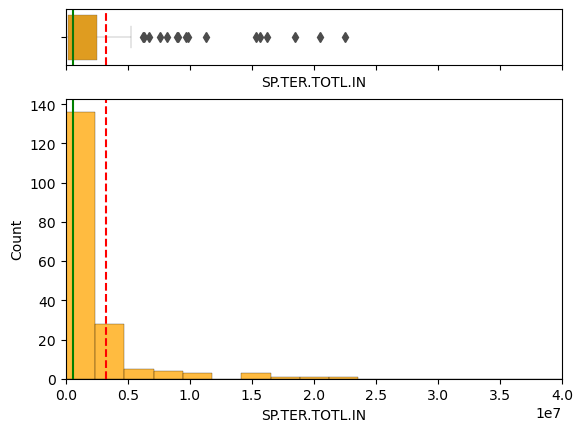

In [126]:
#distribution des données dans l'indicateur SP.TER.TOTL.IN' dans 'année 2013 après imputation"
stats_viz(df=df2013_final, indicator='SP.TER.TOTL.IN')


 Indicateur  SP.TER.TOTL.IN  

la valeur moyenne est : 3750079.090909091


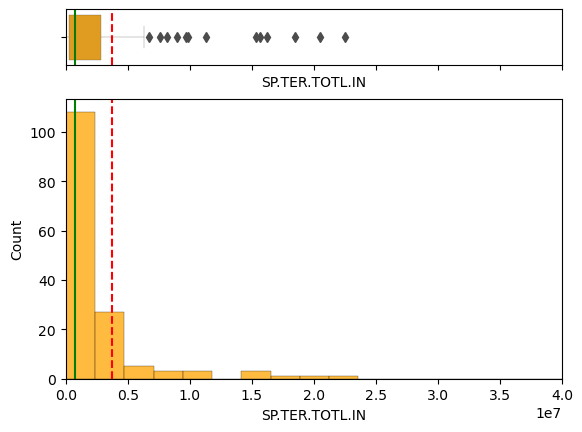

In [127]:
##distribution des données dans l'indicateur SP.TER.TOTL.IN' dans année 2013 avant imputation"

stats_viz(df=df_2013, indicator='SP.TER.TOTL.IN')

In [128]:
((3750079.090909091-3250873.7608695654)/3250873.7608695654)*100

15.356035538765264

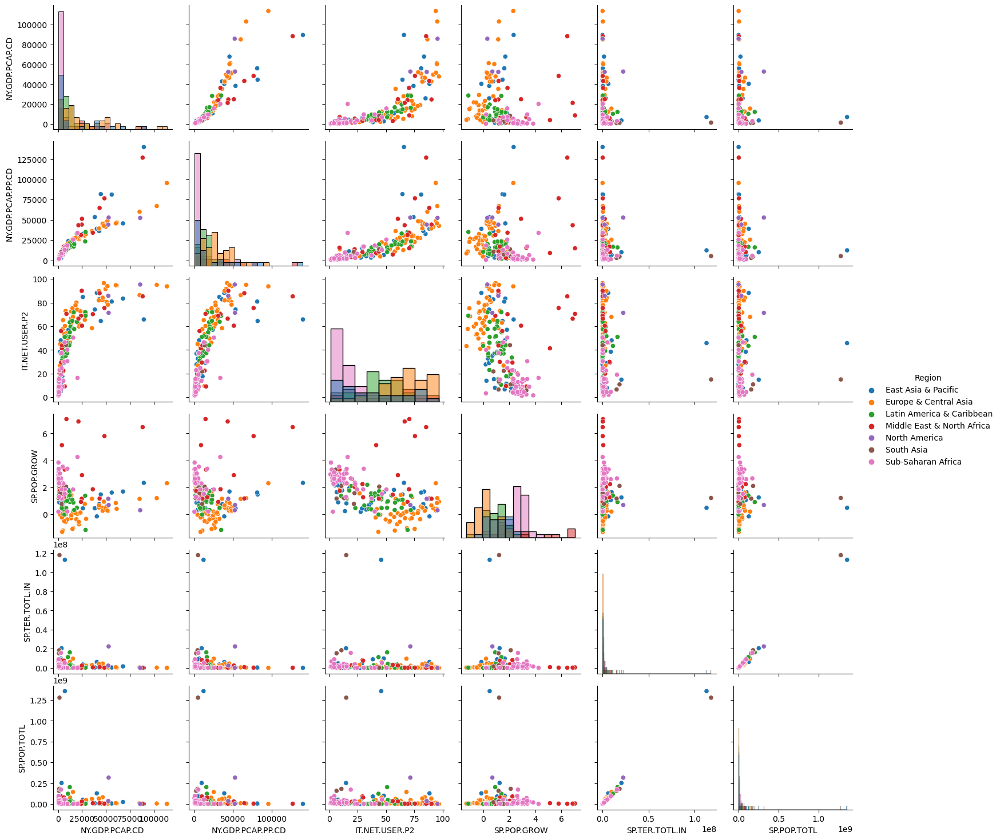

In [129]:
g = sns.PairGrid(df2013_final, hue="Region")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.savefig("pairgrid_2013.png")

<h2  style="margin: auto; 
            text-align: center; 
            font-family:Helvetica, Arial, verdana, sans-serif"><a name="C5"> 5. Analyse </a> </h2>
<br>

##   5.1.  Analyse de l'évolution des indicateurs
### Analyse des TOP 25  pays selon l'importance de chaque indicateur dans l'année 2013 vs 2010

In [130]:
def plot_Ind_evolution_by_country(Indicator, color, df1,df2 ):
    df1=df1.sort_values(Indicator, ascending=False).head(25)
    df2=df2.sort_values(Indicator, ascending=False).head(25)
    f, ax = plt.subplots(figsize = (6,5))
    #sns.set_color_codes('pastel')
    sns.barplot(x =Indicator, y ='Country', data = df1,
                label = '2010', color = color, edgecolor = 'w', alpha=0.6)
    sns.barplot(x = Indicator, y ='Country', data = df2,
                label = '2013', color = color, edgecolor = 'w', alpha=0.3)
    
    ax.legend(ncol = 2, loc='best', bbox_to_anchor=(0.2, 0., 0.5, -0.1))
    sns.despine(left = True, bottom = True)
    plt.savefig( Indicator + ".png")

    plt.show()



In [131]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()] 

####   📊  5.1.1 Top 25  pays  avec le plus d'accès à Internet 

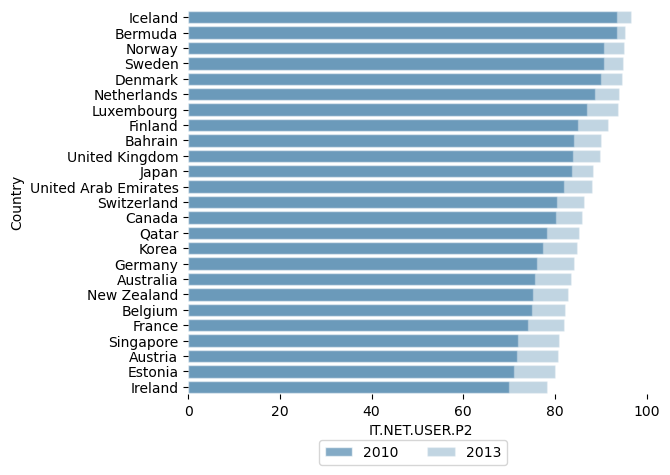

In [132]:
plot_Ind_evolution_by_country('IT.NET.USER.P2', cols[0], df2010_final, df2013_final)


####  📊 5.1.2 Top 25  pays vingt pays avec le plus grand GDP per capita

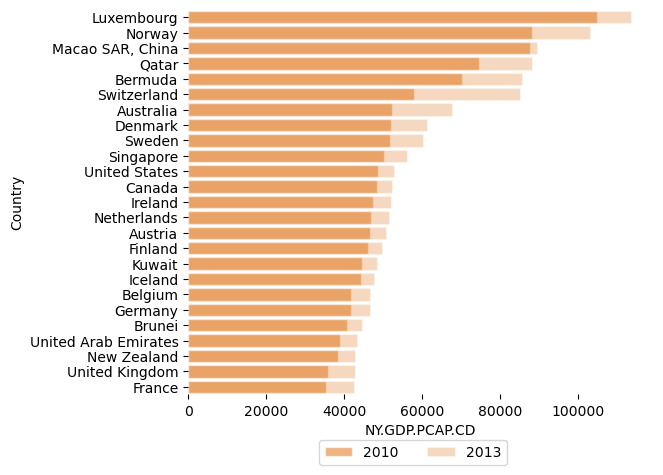

In [133]:
plot_Ind_evolution_by_country('NY.GDP.PCAP.CD', cols[1], df2010_final, df2013_final)


####  📊 5.1.3 Top 25  pays dont la population en âge d'étudier dans l'enseignement supérieur est la plus élevée

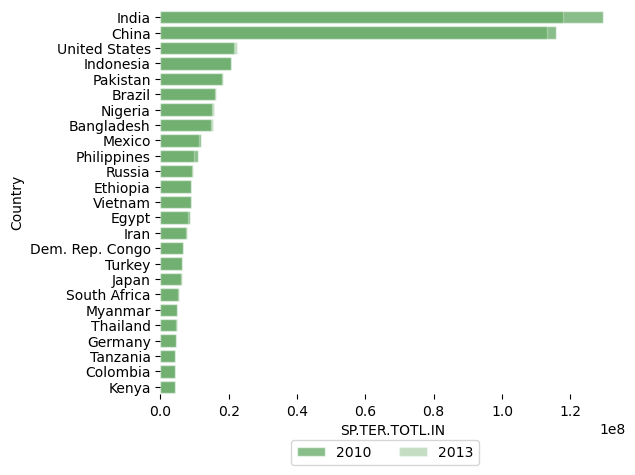

In [134]:
plot_Ind_evolution_by_country('SP.TER.TOTL.IN', cols[2], df2010_final, df2013_final)


####  📊 5.1.4 Top 25  des pays avec la plus forte croissance démographique (en pourcentage)

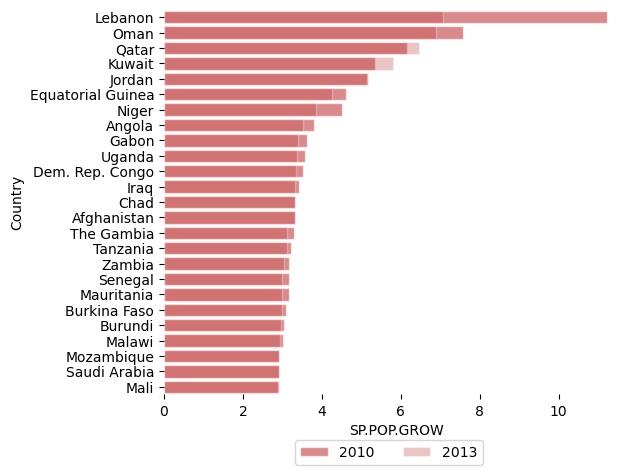

In [135]:
plot_Ind_evolution_by_country('SP.POP.GROW', cols[3], df2010_final, df2013_final)

##   5.2.   Modèle d'expansion

### 5.2.1  Combinaison des données des années d'intérêt

In [136]:
frames = [df2010_final, df2013_final]
df20102013 = pd.concat(frames)
df20102013

,Region,Country code,Country,Year,Income group,NY.GDP.PCAP.CD,NY.GDP.PCAP.PP.CD,IT.NET.USER.P2,SP.POP.GROW,SP.TER.TOTL.IN,SP.POP.TOTL
0,East Asia & Pacific,AUS,Australia,2010,High income: OECD,51874.080482,39191.035625,76.0,1.555490,1577526.0,2.203175e+07
1,East Asia & Pacific,BRN,Brunei,2010,High income: nonOECD,35268.101170,78923.390474,53.0,1.266145,36896.0,3.886620e+05
2,East Asia & Pacific,CHN,China,2010,Upper middle income,4560.512586,9333.124237,34.3,0.482960,129642728.0,1.337705e+09
3,East Asia & Pacific,FJI,Fiji,2010,Upper middle income,3651.966784,7203.365693,20.0,0.932645,77469.0,8.599500e+05
4,East Asia & Pacific,FSM,Micronesia,2010,Lower middle income,2861.771348,3230.949855,20.0,-0.331445,12030.0,1.036160e+05
...,...,...,...,...,...,...,...,...,...,...,...
179,Sub-Saharan Africa,TZA,Tanzania,2013,Low income,901.731430,2397.212978,4.4,3.116185,4339127.0,5.063660e+07
180,Sub-Saharan Africa,UGA,Uganda,2013,Low income,655.049607,1666.976794,15.5,3.376766,3351920.0,3.755373e+07
181,Sub-Saharan Africa,ZAF,South Africa,2013,Upper middle income,6880.445673,12879.591337,46.5,1.522336,5266763.0,5.331196e+07
182,Sub-Saharan Africa,ZMB,Zambia,2013,Lower middle income,1850.793359,3701.392674,15.4,3.036918,1458724.0,1.515321e+07


### 5.2.2  Normalisation de mes indicateurs (création du système de notation)

In [137]:
potential = df20102013.copy()

In [138]:
indicators = potential.columns[5:]
indicators

Index(['NY.GDP.PCAP.CD', 'NY.GDP.PCAP.PP.CD', 'IT.NET.USER.P2', 'SP.POP.GROW',
       'SP.TER.TOTL.IN', 'SP.POP.TOTL'],
      dtype='object')

In [139]:
for indicator in indicators:
    print(indicator, potential[indicator].max())
    

NY.GDP.PCAP.CD 113625.13289956
NY.GDP.PCAP.PP.CD 140037.115597332
IT.NET.USER.P2 96.5468
SP.POP.GROW 11.2206863282288
SP.TER.TOTL.IN 129642728.0
SP.POP.TOTL 1357380000.0


In [140]:
for indicator in indicators:
    splited = indicator.split(' ')
    col_name =''
    for elem in splited[:3]:
        col_name+= ' '
        col_name+=elem
    potential['Score {}'.format(col_name)] = potential[indicator]/potential[indicator].max()
potential.head()

,Region,Country code,Country,Year,Income group,NY.GDP.PCAP.CD,NY.GDP.PCAP.PP.CD,IT.NET.USER.P2,SP.POP.GROW,SP.TER.TOTL.IN,SP.POP.TOTL,Score NY.GDP.PCAP.CD,Score NY.GDP.PCAP.PP.CD,Score IT.NET.USER.P2,Score SP.POP.GROW,Score SP.TER.TOTL.IN,Score SP.POP.TOTL
0,East Asia & Pacific,AUS,Australia,2010,High income: OECD,51874.080482,39191.035625,76.0,1.555490,1577526.0,2.203175e+07,0.456537,0.279862,0.787183,0.138627,0.012168,0.016231
1,East Asia & Pacific,BRN,Brunei,2010,High income: nonOECD,35268.101170,78923.390474,53.0,1.266145,36896.0,3.886620e+05,0.310390,0.563589,0.548957,0.112840,0.000285,0.000286
2,East Asia & Pacific,CHN,China,2010,Upper middle income,4560.512586,9333.124237,34.3,0.482960,129642728.0,1.337705e+09,0.040136,0.066648,0.355268,0.043042,1.000000,0.985505
3,East Asia & Pacific,FJI,Fiji,2010,Upper middle income,3651.966784,7203.365693,20.0,0.932645,77469.0,8.599500e+05,0.032140,0.051439,0.207153,0.083118,0.000598,0.000634
4,East Asia & Pacific,FSM,Micronesia,2010,Lower middle income,2861.771348,3230.949855,20.0,-0.331445,12030.0,1.036160e+05,0.025186,0.023072,0.207153,-0.029539,0.000093,0.000076


In [141]:
potential.columns[potential.columns.str.contains('Score')]

Index(['Score  NY.GDP.PCAP.CD', 'Score  NY.GDP.PCAP.PP.CD',
       'Score  IT.NET.USER.P2', 'Score  SP.POP.GROW', 'Score  SP.TER.TOTL.IN',
       'Score  SP.POP.TOTL'],
      dtype='object')

In [142]:
number_scores = len(potential.columns[potential.columns.str.contains('Score')].tolist())
number_scores

6

### 5.2.3 Le Modèle
### Mon modèle pour identifier les 25 pays avec le plus grand potentiel pour une start-up academy et son expansion 

In [143]:
potential['Potential score'] = (potential['Score  IT.NET.USER.P2'] + ((potential['Score  NY.GDP.PCAP.CD'] + potential['Score  NY.GDP.PCAP.PP.CD'])/2) + potential['Score  SP.POP.GROW'] + potential['Score  SP.TER.TOTL.IN'] + potential['Score  SP.POP.TOTL'])/(number_scores-1)


In [144]:
display(potential.head(4), potential.shape)

,Region,Country code,Country,Year,Income group,NY.GDP.PCAP.CD,NY.GDP.PCAP.PP.CD,IT.NET.USER.P2,SP.POP.GROW,SP.TER.TOTL.IN,SP.POP.TOTL,Score NY.GDP.PCAP.CD,Score NY.GDP.PCAP.PP.CD,Score IT.NET.USER.P2,Score SP.POP.GROW,Score SP.TER.TOTL.IN,Score SP.POP.TOTL,Potential score
0,East Asia & Pacific,AUS,Australia,2010,High income: OECD,51874.080482,39191.035625,76.0,1.555490,1577526.0,2.203175e+07,0.456537,0.279862,0.787183,0.138627,0.012168,0.016231,0.264482
1,East Asia & Pacific,BRN,Brunei,2010,High income: nonOECD,35268.101170,78923.390474,53.0,1.266145,36896.0,3.886620e+05,0.310390,0.563589,0.548957,0.112840,0.000285,0.000286,0.219871
2,East Asia & Pacific,CHN,China,2010,Upper middle income,4560.512586,9333.124237,34.3,0.482960,129642728.0,1.337705e+09,0.040136,0.066648,0.355268,0.043042,1.000000,0.985505,0.487441
3,East Asia & Pacific,FJI,Fiji,2010,Upper middle income,3651.966784,7203.365693,20.0,0.932645,77469.0,8.599500e+05,0.032140,0.051439,0.207153,0.083118,0.000598,0.000634,0.066659


(370, 18)

In [145]:
top25_scores=potential.groupby(['Region','Country code', 'Country', 'Income group']).mean().sort_values('Potential score', ascending=False).head(25).round(2)[['Potential score']].reset_index()
top25_scores

,Region,Country code,Country,Income group,Potential score
0,East Asia & Pacific,CHN,China,Upper middle income,0.49
1,Middle East & North Africa,QAT,Qatar,High income: nonOECD,0.48
2,South Asia,IND,India,Lower middle income,0.42
3,Europe & Central Asia,LUX,Luxembourg,High income: OECD,0.39
4,Europe & Central Asia,NOR,Norway,High income: OECD,0.35
5,Middle East & North Africa,KWT,Kuwait,High income: nonOECD,0.34
6,North America,USA,United States,High income: OECD,0.32
7,Middle East & North Africa,ARE,United Arab Emirates,High income: nonOECD,0.32
8,East Asia & Pacific,MAC,"Macao SAR, China",High income: nonOECD,0.31
9,Europe & Central Asia,CHE,Switzerland,High income: OECD,0.31


In [146]:
#all_scores = potential.groupby(['Region','Country code', 'Country', 'Income group']).mean().sort_values('Potential score', ascending=False).round(2)[['Potential score']].reset_index()
#all_scores

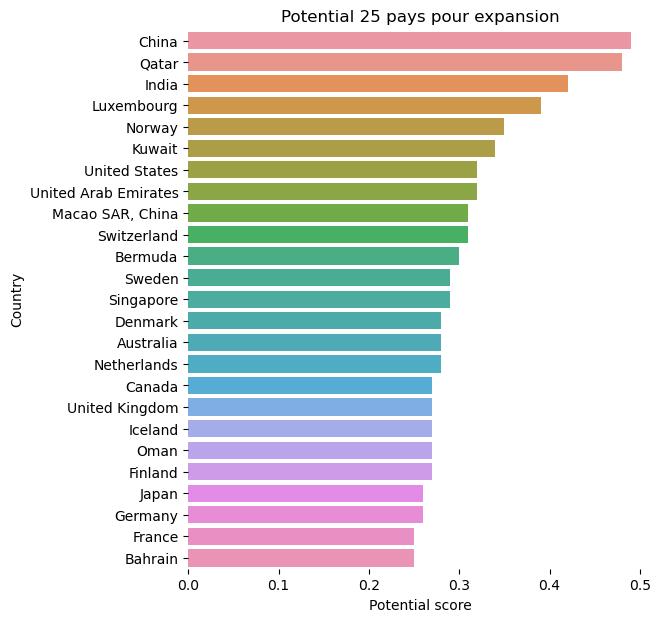

In [147]:
f, ax = plt.subplots(figsize = (6,7))
sns.color_palette("Set2")

sns.barplot(x ='Potential score', y ='Country', data = top25_scores).set_title("Potential 25 pays pour expansion")

sns.despine(left = True, bottom = True)
plt.savefig("Potential_25_pays.png")
plt.show()

In [148]:
Country_score=potential.groupby(['Country']).mean().sort_values('Potential score', ascending=False).head(25).round(2)[['Potential score']].reset_index()


In [149]:
Country_score['Country'].tolist()

['China',
 'Qatar',
 'India',
 'Luxembourg',
 'Norway',
 'Kuwait',
 'United States',
 'United Arab Emirates',
 'Macao SAR, China',
 'Switzerland',
 'Bermuda',
 'Sweden',
 'Singapore',
 'Denmark',
 'Australia',
 'Netherlands',
 'Canada',
 'United Kingdom',
 'Iceland',
 'Oman',
 'Finland',
 'Japan',
 'Germany',
 'France',
 'Bahrain']

In [150]:
# On importe les données géographique des pays 
shape_file = geopandas.read_file('countries.geojson')

# On récupère et prépare les colonnes pertinentes...
shape_file=shape_file[['ISO_A3', 'geometry']]
shape_file.rename(columns={'ISO_A3':'Country code'}, inplace=True)

# On mere ces données au data_final
top25_scores_geo = shape_file.merge(top25_scores, on=['Country code'], how='inner')
#top25_scores_geo = round(top_countries_geo,2)

# On affiche la map avec .explore()
top25_scores_geo.explore(column='Country', legend=True, color='Potential score',
                       tooltip=['Country', 'Region','Income group','Potential score'])

<h2  style="margin: auto; 
            text-align: center; 
            font-family:Helvetica, Arial, verdana, sans-serif"><a name="C6"> 6. Conclusion </a> </h2>
<br>

## 6.1 Quels sont les pays avec un fort potentiel de clients pour nos services ?


In [151]:
top_5_countries=['China',
 'Qatar',
 'India',
 'Luxembourg',
 'Norway']

In [152]:
country_scores=potential.copy()
country_scores.columns

Index(['Region', 'Country code', 'Country', 'Year', 'Income group',
       'NY.GDP.PCAP.CD', 'NY.GDP.PCAP.PP.CD', 'IT.NET.USER.P2', 'SP.POP.GROW',
       'SP.TER.TOTL.IN', 'SP.POP.TOTL', 'Score  NY.GDP.PCAP.CD',
       'Score  NY.GDP.PCAP.PP.CD', 'Score  IT.NET.USER.P2',
       'Score  SP.POP.GROW', 'Score  SP.TER.TOTL.IN', 'Score  SP.POP.TOTL',
       'Potential score'],
      dtype='object')

In [153]:
country_scores.rename(columns={"Score  NY.GDP.PCAP.CD": "Score GDP per capita" ,
                               "Score  NY.GDP.PCAP.PP.CD": "Score GDP per capita, PPP",
                               "Score  IT.NET.USER.P2": "Score Internet users",
                               "Score  SP.POP.GROW": "Score Population growth",
                               "Score  SP.TER.TOTL.IN": "Score Population age for tert. edu.",
                               "Score  SP.POP.TOTL" : "Score Population, total" } , inplace=True)

country_scores.groupby(['Country']).mean().sort_values('Potential score', ascending=False).head(5).round(2)

,NY.GDP.PCAP.CD,NY.GDP.PCAP.PP.CD,IT.NET.USER.P2,SP.POP.GROW,SP.TER.TOTL.IN,SP.POP.TOTL,Score GDP per capita,"Score GDP per capita, PPP",Score Internet users,Score Population growth,Score Population age for tert. edu.,"Score Population, total",Potential score
Country,,,,,,,,,,,,,
China,5819.14,10850.54,40.05,0.49,121334868.0,1.347542e+09,0.05,0.08,0.41,0.04,0.94,0.99,0.49
Qatar,79305.55,124761.22,77.15,8.84,157354.5,2.015074e+06,0.70,0.89,0.80,0.79,0.00,0.00,0.48
India,1398.98,4783.05,11.30,1.29,116866068.0,1.254771e+09,0.01,0.03,0.12,0.12,0.90,0.92,0.42
Luxembourg,109295.22,90684.81,92.20,2.07,31145.0,5.251565e+05,0.96,0.65,0.95,0.18,0.00,0.00,0.39
Norway,95414.76,62566.85,94.22,1.23,321923.5,4.984438e+06,0.84,0.45,0.98,0.11,0.00,0.00,0.35


In [154]:
# China', 'Qatar','India', 'Luxembourg', 'Norway'


scores = pd.concat([country_scores['Country'],country_scores.iloc[:,11:]], axis=1).groupby('Country').mean().reset_index().round(2)
fig = go.Figure(
    data=[
        go.Scatterpolar(r= scores[scores.Country=='China'].iloc[:,1:].values[0],theta = scores.iloc[:,1:].columns,fill = 'toself',name='China'),
        go.Scatterpolar(r= scores[scores.Country=='Qatar'].iloc[:,1:].values[0],theta = scores.iloc[:,1:].columns,fill = 'toself',name='Qatar'),
        go.Scatterpolar(r= scores[scores.Country=='India'].iloc[:,1:].values[0],theta = scores.iloc[:,1:].columns,fill = 'toself',name='India'),
        go.Scatterpolar(r= scores[scores.Country=='Luxembourg'].iloc[:,1:].values[0],theta = scores.iloc[:,1:].columns,fill = 'toself',name='Luxembourg'),
        go.Scatterpolar(r= scores[scores.Country=='Norway'].iloc[:,1:].values[0],theta = scores.iloc[:,1:].columns,fill = 'toself',name='Norway'),
    ],
    layout=go.Layout(
        title=go.layout.Title(text='Top 5 Countries scores comparison', x=0.5 ),
        polar={'radialaxis': {'visible': True}},
        showlegend=True,
       
    )
)
iplot(fig)

In [155]:
df_top_5_countries=df_final.loc[df_final['Country'].isin(top_5_countries)]
df_top_5_countries.columns

Index(['Region', 'Country code', 'Country', 'Year', 'Income group',
       'Enrol. tert. per 100,000 inh', 'Enrol. tert. all programs',
       'GDP per capita', 'GDP per capita, PPP',
       'Government expend. on edu as % of GDP (%)',
       'Government expend. on tert. edu as % of GDP (%)',
       'Government expend. per tert. studet as % of GDP (%)', 'Internet users',
       'Population growth', 'Population age for tert. edu.',
       'Population, total'],
      dtype='object')

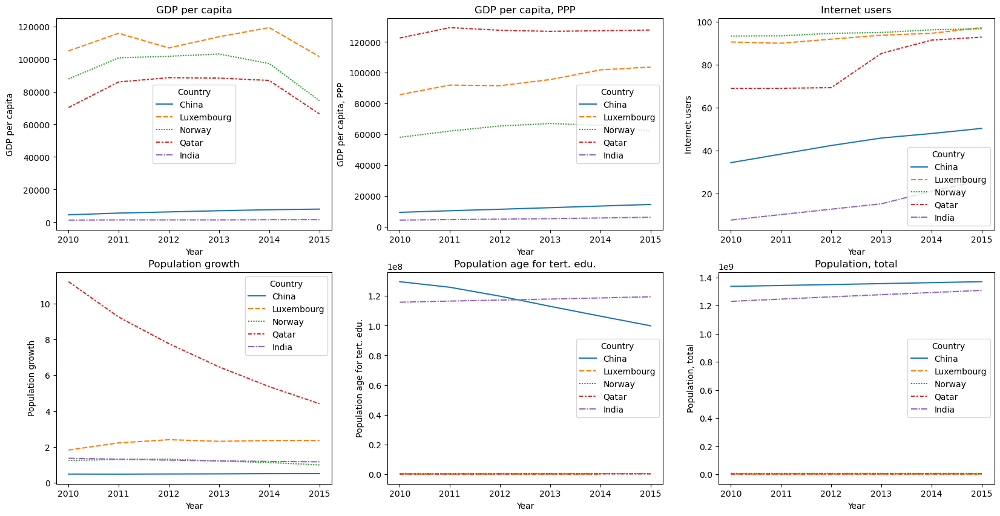

In [156]:
fig, axes = plt.subplots(2, 3, figsize=(20,10), sharex=False, sharey=False)

sns.lineplot(ax=axes[0,0], data= df_top_5_countries, x='Year', y='GDP per capita', hue='Country', style='Country')
axes[0,0].set_title('GDP per capita')

sns.lineplot(ax=axes[0,1], data= df_top_5_countries, x='Year', y='GDP per capita, PPP', hue='Country', style='Country')
axes[0,1].set_title('GDP per capita, PPP')

sns.lineplot(ax=axes[0,2], data= df_top_5_countries, x='Year', y='Internet users', hue='Country', style='Country')
axes[0,2].set_title('Internet users')

sns.lineplot(ax=axes[1,0], data= df_top_5_countries, x='Year', y='Population growth', hue='Country', style='Country')
axes[1,0].set_title('Population growth')

sns.lineplot(ax=axes[1,1], data= df_top_5_countries, x='Year', y='Population age for tert. edu.', hue='Country', style='Country')
axes[1,1].set_title('Population age for tert. edu.')

sns.lineplot(ax=axes[1,2], data= df_top_5_countries, x='Year', y='Population, total', hue='Country', style='Country')
axes[1,2].set_title('Population, total')


plt.savefig( "Evolution_indicateurs_lineplot.png")
plt.show()
